# **Text Mining Project**
## _Analyzing User Feedback Across Gojek App Versions: A Sentiment and Topic Modeling Approach_

**Project By:** <br>
Johanes Cedrick - 2702213801 <br>
Marco Linardi <br>
Villyan Sutanto - 2702291311

=================================================================================================================================================================================================================================================

## Case Overview
blablabla

=================================================================================================================================================================================================================================================

## Objectives
blablabla

=================================================================================================================================================================================================================================================

## A. Data Overview

### A.1. Import Data

In [193]:
import pandas as pd

In [194]:
df = pd.read_csv('data/gojek_reviews_high_terbaru.csv')
df.head()

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final
0,0,mantaap,5,4.89.1,4.x,7,1,mantap,positive,0.999183,high,positive,positive
1,1,Pelayanan nya cepat..,5,5.61.1,5.x,21,3,pelayanan nya cepat,positive,0.997752,high,positive,positive
2,2,jangan karna ownernya masuk penjara jadi lemot...,1,5.61.1,5.x,58,10,jangan karena ownernya masuk penjara jadi lamb...,negative,0.998800,high,negative,negative
3,3,mantap,5,5.61.1,5.x,6,1,mantap,positive,0.999183,high,positive,positive
4,4,Gofood sangat membantu sekali dalam keadaan la...,5,5.60.1,5.x,297,44,gofood sangat membantu sekali dalam keadaan la...,positive,0.998567,high,positive,positive


### A.2. Data Info

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100291 entries, 0 to 100290
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   review_id           100291 non-null  int64  
 1   original            100291 non-null  object 
 2   score               100291 non-null  int64  
 3   appVersion          100291 non-null  object 
 4   major_version       100291 non-null  object 
 5   length              100291 non-null  int64  
 6   word_count          100291 non-null  int64  
 7   content             100291 non-null  object 
 8   sentiment           100291 non-null  object 
 9   confidence          100291 non-null  float64
 10  confidence_band     100291 non-null  object 
 11  expected_sentiment  100291 non-null  object 
 12  sentiment_final     100291 non-null  object 
dtypes: float64(1), int64(4), object(8)
memory usage: 9.9+ MB


### A.3. Check Null Data

In [196]:
df.isnull().sum()

review_id             0
original              0
score                 0
appVersion            0
major_version         0
length                0
word_count            0
content               0
sentiment             0
confidence            0
confidence_band       0
expected_sentiment    0
sentiment_final       0
dtype: int64

In [197]:
df = df.dropna(subset=['content'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100291 entries, 0 to 100290
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   review_id           100291 non-null  int64  
 1   original            100291 non-null  object 
 2   score               100291 non-null  int64  
 3   appVersion          100291 non-null  object 
 4   major_version       100291 non-null  object 
 5   length              100291 non-null  int64  
 6   word_count          100291 non-null  int64  
 7   content             100291 non-null  object 
 8   sentiment           100291 non-null  object 
 9   confidence          100291 non-null  float64
 10  confidence_band     100291 non-null  object 
 11  expected_sentiment  100291 non-null  object 
 12  sentiment_final     100291 non-null  object 
dtypes: float64(1), int64(4), object(8)
memory usage: 9.9+ MB


In [198]:
df = df[df['content'] != '']

### A.4. Check Duplicated Data

In [199]:
df.duplicated().sum()

np.int64(0)

In [200]:
df[df.duplicated()]

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final


In [201]:
df['content'].duplicated().sum()
# NANTI SETELAH PREPROCESSING, AKAN DI CEK KEMBALI
# DUPLICATED TERJADI KARENA BANYAK REVIEW PENDEK DENGAN KATA YANG SAMA
# KATA PENDEK-PENDEK GAK MEMBERI INSIGHT DI TOPIC MODELING
# NANTI BISA DI DROP

np.int64(36661)

=================================================================================================================================================================================================================================================

## B. Exploratory Data Analysis (EDA)

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(
    style="whitegrid",
    context="notebook",
    rc={
        "figure.facecolor": "#FFFFFF",
        "axes.facecolor": "#F8FAFC",
        "axes.edgecolor": "#E5E7EB",

        "grid.color": "#E5E7EB",
        "grid.linestyle": "--",
        "grid.linewidth": 0.7,

        "axes.labelcolor": "#334155",
        "xtick.color": "#475569",
        "ytick.color": "#475569",
        "text.color": "#334155",

        "axes.titlesize": 14,
        "axes.titleweight": "bold",
        "axes.titlecolor": "#1E293B",

        "font.size": 11,
    }
)

sns.set_palette(
    'tab20'
)

### B.1. Length Distribution

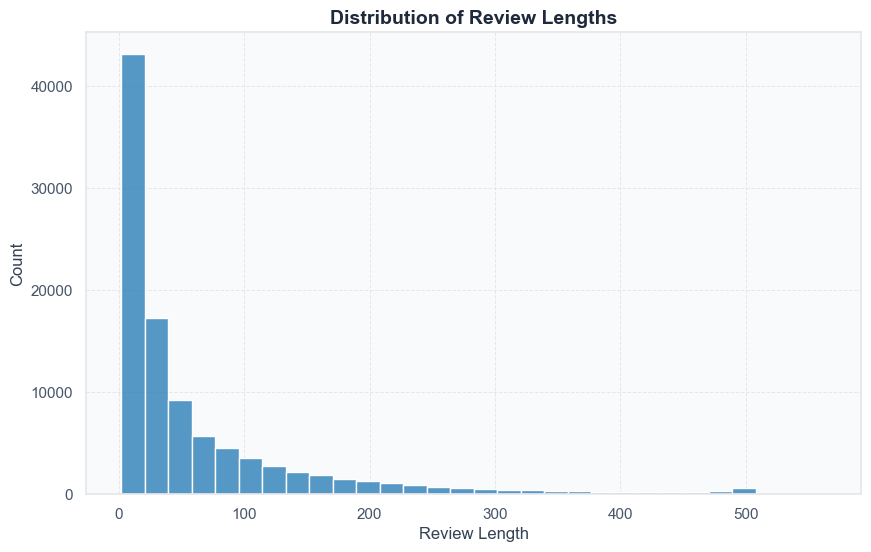

In [203]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='length', bins=30)
plt.title('Distribution of Review Lengths')
plt.xlabel('Review Length')
plt.ylabel('Count')
plt.show()

In [204]:
df['length'].value_counts().sort_index(ascending=False).head(10)

length
564      1
500    137
499    102
498     78
497     62
496     52
495     44
494     42
493     37
492     32
Name: count, dtype: int64

In [205]:
df['length'].value_counts().sort_index(ascending=True).head(10)

length
2       20
3      834
4     4976
5     5316
6     6685
7     1835
8     2082
9     1615
10    1507
11    2136
Name: count, dtype: int64

In [206]:
df.sort_values(by='length', ascending=True).head(10)

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final
49707,58206,Ol,5,5.6.1,5.x,2,1,ol,negative,0.994365,high,positive,negative
97602,114972,Ah,4,4.80.4,4.x,2,1,ah,positive,0.952462,high,positive,positive
79320,93236,Pe,5,4.87.3,4.x,2,1,pe,positive,0.956126,high,positive,positive
55519,65031,Ol,4,4.86.2,4.x,2,1,ol,negative,0.994365,high,positive,negative
71063,83446,Re,4,4.91.1,4.x,2,1,re,positive,0.974023,high,positive,positive
79645,93624,Wa,2,4.87.3,4.x,2,1,wa,positive,0.987574,high,negative,positive
79961,94002,Ol,5,4.82.1,4.x,2,1,ol,negative,0.994365,high,positive,negative
96158,113240,Ol,5,4.80.4,4.x,2,1,ol,negative,0.994365,high,positive,negative
57604,67472,Ah,5,5.0.1,5.x,2,1,ah,positive,0.952462,high,positive,positive
69848,81975,Ik,4,4.92.1,4.x,2,1,ik,positive,0.922665,high,positive,positive


In [207]:
df.sort_values(by='length', ascending=False).head(10)

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final
16114,18704,"Sya sangat amat kecewa dgn apl ini, sya pesan ...",5,3.8.1,3.x,564,101,sya sangat amat kecewa dengan apl ini sya pesa...,negative,0.999252,high,positive,negative
18796,21836,masa pesan 2 minuman aja suruh nunggu spai sej...,1,5.38.1,5.x,500,81,masa pesan minuman saja suruh nunggu spai seja...,negative,0.999257,high,negative,negative
50386,59016,"Beberapa kali melakukan pemesanan Gofood, dan ...",1,5.6.1,5.x,500,67,beberapa kali melakukan pemesanan gofood dan s...,negative,0.997374,high,negative,negative
95897,112923,makin lama makin banyak biaya yg tdk masuk aka...,1,4.81.2,4.x,500,89,makin lama makin banyak biaya yang tidak masuk...,negative,0.998728,high,negative,negative
18815,21859,Halo gojek saya menerima perlakuan kurang pant...,1,5.38.1,5.x,500,85,halo gojek saya menerima perlakuan kurang pant...,negative,0.997693,high,negative,negative
18759,21797,"Saya kasih masukan, saya telpon ke gojek habis...",1,5.38.1,5.x,500,75,saya kasih masukan saya telpon ke gojek habis ...,negative,0.999365,high,negative,negative
59071,69183,"aku rating 4 dulu yaa, soalnya masih trut isue...",4,4.99.1,4.x,500,87,saya rating dulu yaa soalnya masih trut isue s...,negative,0.996291,high,positive,negative
43440,50799,apk gak konsisten dan gak jelas.gopay pinjam g...,1,5.12.1,5.x,500,80,apk tidak konsisten dan tidak jelas gopay pinj...,negative,0.999344,high,negative,negative
40212,47081,gojeknya bagus tpi kdang susah dapat driver da...,1,5.14.2,5.x,500,87,gojeknya bagus tapi kdang susah dapat driver d...,negative,0.998592,high,negative,negative
12737,14786,betul lagi musim ujan cari driver susah dan ja...,2,5.46.2,5.x,500,82,betul lagi musim ujan cari driver susah dan ja...,negative,0.997915,high,negative,negative


### B.2. Word Count Distribution

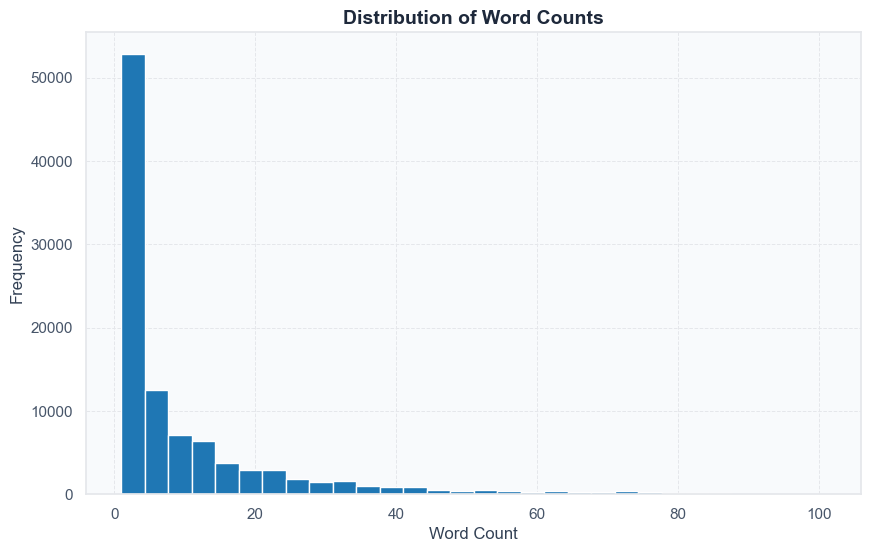

In [208]:
plt.figure(figsize=(10, 6))
plt.hist(df['word_count'], bins=30)
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.title('Distribution of Word Counts')
plt.show()

In [209]:
df['word_count'].value_counts().sort_index(ascending=False).head(10)

word_count
101     3
99      2
98      2
97      4
96      1
95      6
94      6
93      7
92     11
91     13
Name: count, dtype: int64

In [210]:
df['word_count'].value_counts().sort_index(ascending=True).head(10)

word_count
1     22055
2     15135
3      8617
4      7006
5      5203
6      4004
7      3268
8      2713
9      2387
10     2039
Name: count, dtype: int64

In [211]:
df.sort_values(by='word_count', ascending=True).head(10)

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final
100217,118128,Best,5,4.80.4,4.x,4,1,best,positive,0.998916,high,positive,positive
52825,61885,Membantu,5,4.96.2,4.x,8,1,membantu,positive,0.946509,high,positive,positive
52828,61888,Nice,5,5.2.1,5.x,4,1,bagus,positive,0.998097,high,positive,positive
52829,61889,Nice,5,4.93.1,4.x,4,1,bagus,positive,0.998097,high,positive,positive
52832,61892,Amanah,5,5.4.1,5.x,6,1,amanah,positive,0.981896,high,positive,positive
100290,118213,Nice,5,4.80.4,4.x,4,1,bagus,positive,0.998097,high,positive,positive
3,3,mantap,5,5.61.1,5.x,6,1,mantap,positive,0.999183,high,positive,positive
11,13,aman,5,5.61.1,5.x,4,1,aman,negative,0.925527,high,positive,negative
100257,118176,Mantap,5,4.80.4,4.x,6,1,mantap,positive,0.999183,high,positive,positive
100195,118103,Bagus,5,4.80.2,4.x,5,1,bagus,positive,0.998097,high,positive,positive


In [212]:
df.sort_values(by='word_count', ascending=False).head(10)

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final
59850,70105,"Knp ya skrg mlah makin ngaco titik nya, mana j...",2,4.93.1,4.x,497,101,kenapa ya sekarang mlah makin ngaco titik nya ...,negative,0.999065,high,negative,negative
2444,2871,"EHHHH GOJEK LU BNR BNR YA, SYA UDH NUNGGU LAMA...",1,5.58.1,5.x,499,101,ehh gojek kamu bnr bnr ya sya sudah nunggu lam...,negative,0.995324,high,negative,negative
16114,18704,"Sya sangat amat kecewa dgn apl ini, sya pesan ...",5,3.8.1,3.x,564,101,sya sangat amat kecewa dengan apl ini sya pesa...,negative,0.999252,high,positive,negative
45388,53114,pernh gk klian psan brng dngan jsa instan atau...,1,5.11.1,5.x,500,99,pernh tidak klian psan brng dngan jsa instan a...,negative,0.930492,high,negative,negative
36444,42655,parah orderan udh 1.5 jam blm beres . gara gar...,1,5.18.2,5.x,466,99,parah orderan sudah jam belum beres gara gara ...,negative,0.993312,high,negative,negative
87142,102480,Tolong dong perbaiki lgi SDM para driver masa ...,1,4.81.2,4.x,495,98,tolong perbaiki lagi sdm para driver masa kasa...,negative,0.997477,high,negative,negative
20500,23802,sy cmn mau komplen sm driver hr ini. biasa dri...,5,5.35.1,5.x,492,98,saya cmn mau komplen sama driver hr ini biasa ...,negative,0.998187,high,positive,negative
20874,24245,"ko tiba""pas pake gocar malah mahal bngt sih, m...",1,5.22.2,5.x,498,97,ko tiba pas pakai gocar malah mahal banget mal...,negative,0.999036,high,negative,negative
18149,21091,emg kalo pke gocar yg hemat salah? namanya org...,2,5.38.1,5.x,493,97,memang kalau pakai gocar yang hemat salah nama...,negative,0.982029,high,negative,negative
1479,1722,"ijin ya, hari ini bener2 kecewa banget, mau pe...",3,5.59.1,5.x,497,97,ijin ya hari ini bener kecewa banget mau pergi...,negative,0.999009,high,neutral,negative


### B.3. WordCloud

In [213]:
from wordcloud import WordCloud

In [214]:
def generate_wordcloud(text, title):
    wc = WordCloud(width=1000, height=500, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()

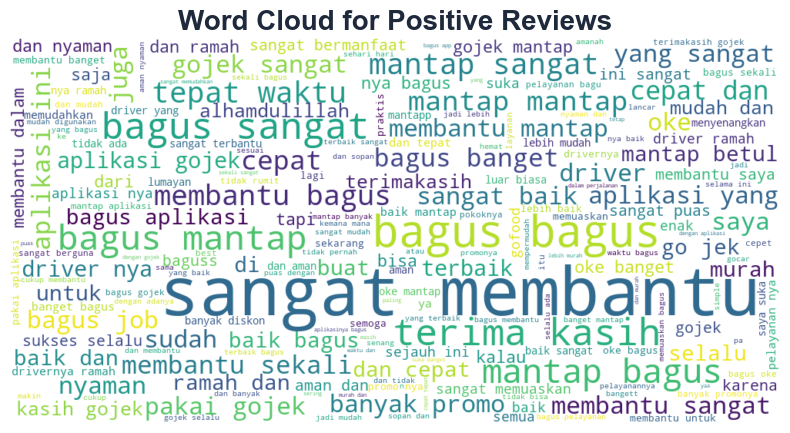

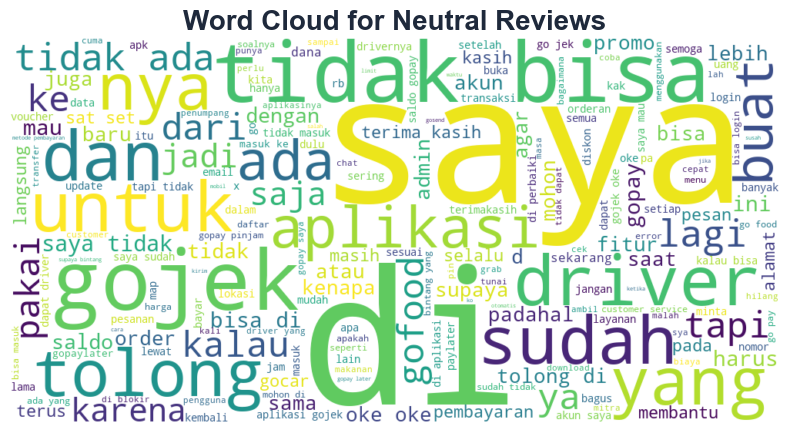

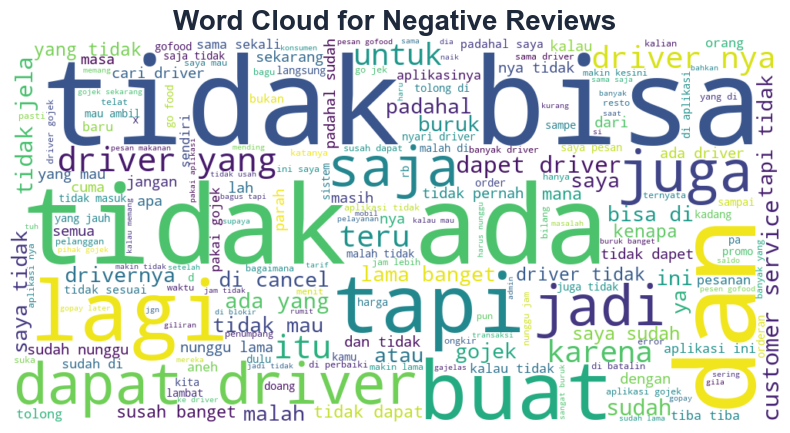

In [215]:
sentiment_groups = ['positive', 'neutral', 'negative']

for s in sentiment_groups:
    text = ' '.join(df[df['sentiment'] == s]['content'])
    generate_wordcloud(text, f'Word Cloud for {s.capitalize()} Reviews')
# HASILNYA UNTUK POSITIVE EMANG OKE
# BUAT NEGATIVE BANYAK KONJUGSI KATA
# MUNGKIN BISA PAKE STOPWORD REMOVAL BUAT DAPETIN KATA KATA DI NEGATIVE REVIEWS

### B.4. Top Word Frequency

In [216]:
from sklearn.feature_extraction.text import CountVectorizer

In [217]:
def word_frequency(df, label):
    subset = df[df['sentiment'] == label]

    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(subset['content'])

    freq = X.sum(axis=0).A1
    vocab = vectorizer.get_feature_names_out()

    freq_df = pd.DataFrame({'word': vocab, 'frequency': freq})
    freq_df = freq_df.sort_values(by='frequency', ascending=False)

    return freq_df

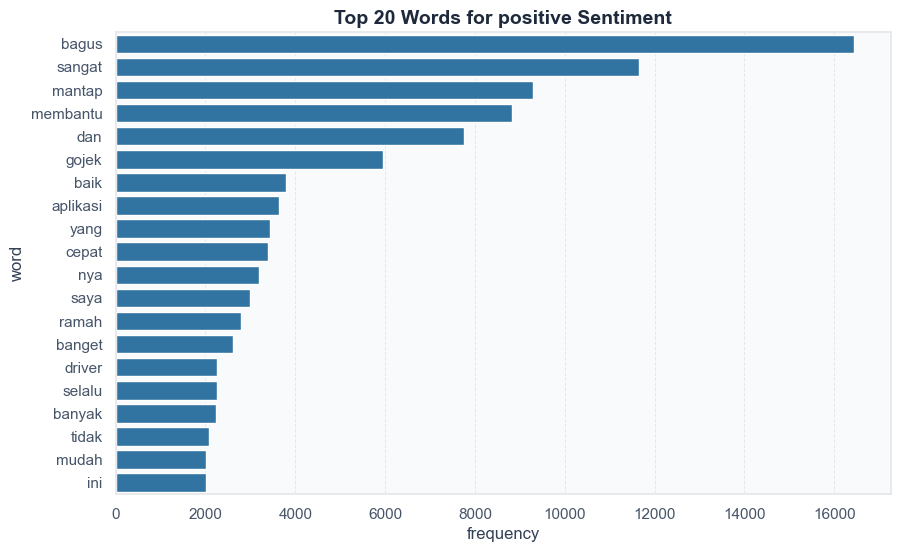

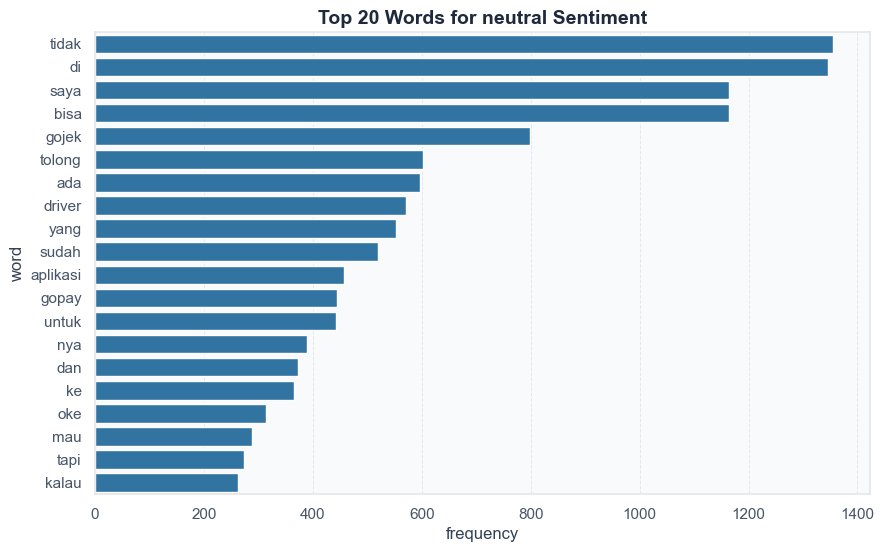

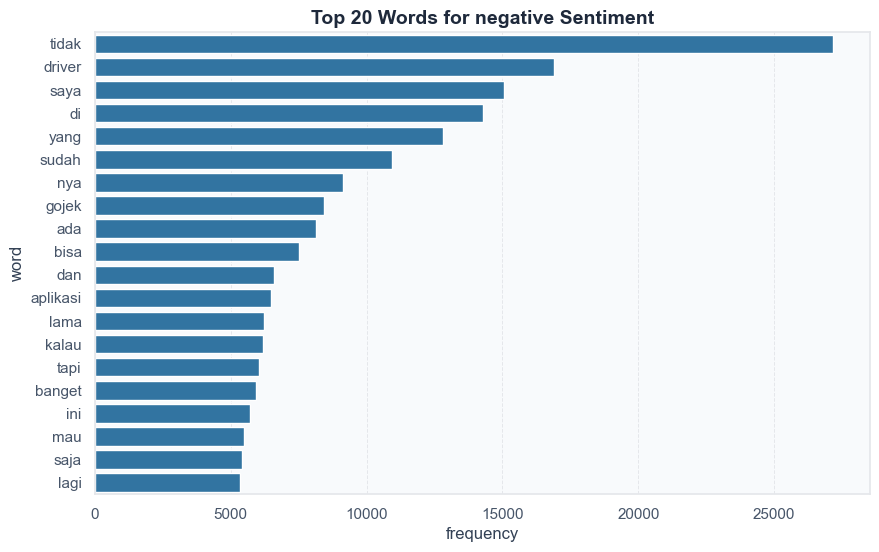

In [218]:
sentiment_groups = ['positive', 'neutral', 'negative']
for s in sentiment_groups:
    freq_df = word_frequency(df, s)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=freq_df.head(20), x='frequency', y='word')
    plt.title(f'Top 20 Words for {s} Sentiment')
    plt.show()

### B.5. Sentiment Label Distribution

In [219]:
df['sentiment'].value_counts()

sentiment
positive    62028
negative    33930
neutral      4333
Name: count, dtype: int64

<Axes: ylabel='count'>

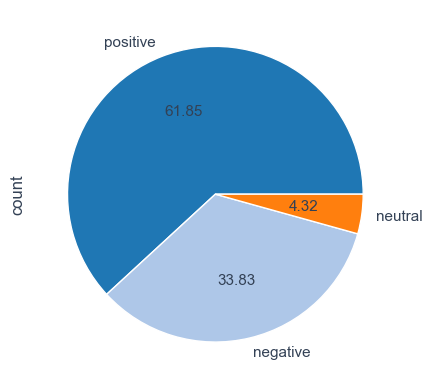

In [220]:
df['sentiment'].value_counts().plot.pie(autopct='%.2f')

### B.6. Version Distribution

major_version
5.x    54917
4.x    44892
3.x      441
2.x       37
1.x        4
Name: count, dtype: int64


<Axes: ylabel='count'>

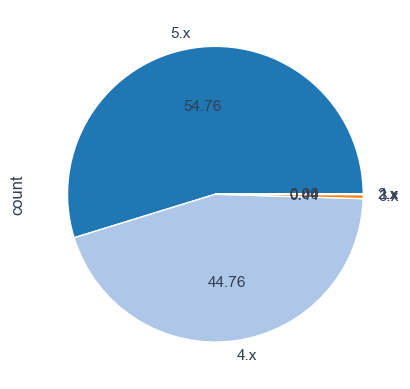

In [221]:
print(df['major_version'].value_counts())
df['major_version'].value_counts().plot.pie(autopct='%.2f')

In [222]:
df['minor_version'] = df['appVersion'].str.split('.').str[:2].str.join('.')
print(df['minor_version'].value_counts())

minor_version
4.81    4084
4.84    4047
4.93    3952
4.89    3378
4.82    3094
        ... 
2.24       1
3.3        1
2.8        1
3.2        1
2.2        1
Name: count, Length: 234, dtype: int64


=================================================================================================================================================================================================================================================

## C. Data Preprocessing

In [223]:
# vocab sebelum preprocess
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['content'])
vocab = vectorizer.get_feature_names_out()
print(len(vocab))

28865


### C.1. Text Cleaning

In [224]:
import re

In [225]:
def text_cleaning(text):
    text = text.lower() # lowercase
    text = re.sub(r'[\n\r\t]', ' ', text) # delete newline atau tab
    text = text.replace("`", "'") # ganti petik, jadi petik yang biasa
    text = re.sub(r'http\S+|www\S+', '', text) # hapus jika ada URL
    text = re.sub(r'@\w+|#\w+', '', text) # hapus mention or hastag
    text = re.sub(r'\d+', '', text) # hapus angka
    text = re.sub(r'(.)\1{2,}', r'\1\1', text) # hapus huruf banyak berulang
    text =re.sub(r"[^a-z\s']", ' ', text) # hapus karakter selain alfabet dan petik
    text = re.sub(r'\s+', ' ', text).strip() # rapihin spasi berlebih
    return text

In [226]:
df['cleaned_content'] = df['content'].apply(text_cleaning)
df.head()

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final,minor_version,cleaned_content
0,0,mantaap,5,4.89.1,4.x,7,1,mantap,positive,0.999183,high,positive,positive,4.89,mantap
1,1,Pelayanan nya cepat..,5,5.61.1,5.x,21,3,pelayanan nya cepat,positive,0.997752,high,positive,positive,5.61,pelayanan nya cepat
2,2,jangan karna ownernya masuk penjara jadi lemot...,1,5.61.1,5.x,58,10,jangan karena ownernya masuk penjara jadi lamb...,negative,0.998800,high,negative,negative,5.61,jangan karena ownernya masuk penjara jadi lamb...
3,3,mantap,5,5.61.1,5.x,6,1,mantap,positive,0.999183,high,positive,positive,5.61,mantap
4,4,Gofood sangat membantu sekali dalam keadaan la...,5,5.60.1,5.x,297,44,gofood sangat membantu sekali dalam keadaan la...,positive,0.998567,high,positive,positive,5.60,gofood sangat membantu sekali dalam keadaan la...


### C.2. Remove Stopwords

In [227]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

factory = StopWordRemoverFactory()
stopword_id = factory.get_stop_words()
stopword_id[:10]

['yang',
 'untuk',
 'pada',
 'ke',
 'para',
 'namun',
 'menurut',
 'antara',
 'dia',
 'dua']

In [228]:
tambahan_stopwords = [
    'nih', 'deh', 'sih', 'dong', 'loh', 'lah', 'kan', 'tuh',
    'ya', 'yaa', 'yah', 'yoi', 'iya',
    'gue', 'gw', 'lu', 'lo', 'sy', 'sya', 'aq',
    'yg', 'dgn', 'jg', 'jd', 'krn', 'klo', 'karna', 'soalnya',
    'sm', 'tp', 'udah', 'udh', 'blm', 'emg', 'emang', 'makanya',
    'aja', 'ajah', 'doang',
    'ga', 'gak', 'gk', 'ngga', 'nggak', 'enggak', 'gaada',
    'nya','tolong', 'mohon', 'banget', 'bgt', 'sangat', 'amat',
    'memang', 'masih', 'trus', 'terus', 'lagi', 'saya', 'nya', 'dan', 'go', 'jek'
]

In [229]:
stopwords = set(stopword_id + tambahan_stopwords)

In [230]:
def remove_stopwords(text):
    words = text.split()
    filtered = [w for w in words if w not in stopwords]
    return " ".join(filtered)

In [231]:
df['cleaned_content'] = df['cleaned_content'].apply(remove_stopwords)

In [ ]:
X = vectorizer.fit_transform(df['cleaned_content'])
vocab = vectorizer.get_feature_names_out()
print(len(vocab))

28752


In [233]:
df.head()

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final,minor_version,cleaned_content
0,0,mantaap,5,4.89.1,4.x,7,1,mantap,positive,0.999183,high,positive,positive,4.89,mantap
1,1,Pelayanan nya cepat..,5,5.61.1,5.x,21,3,pelayanan nya cepat,positive,0.997752,high,positive,positive,5.61,pelayanan cepat
2,2,jangan karna ownernya masuk penjara jadi lemot...,1,5.61.1,5.x,58,10,jangan karena ownernya masuk penjara jadi lamb...,negative,0.998800,high,negative,negative,5.61,jangan ownernya masuk penjara jadi lambat apk
3,3,mantap,5,5.61.1,5.x,6,1,mantap,positive,0.999183,high,positive,positive,5.61,mantap
4,4,Gofood sangat membantu sekali dalam keadaan la...,5,5.60.1,5.x,297,44,gofood sangat membantu sekali dalam keadaan la...,positive,0.998567,high,positive,positive,5.60,gofood membantu sekali keadaan lapar mager goj...


### C.3. Check Word Count 

In [234]:
df['word_count'] = df['cleaned_content'].apply(lambda x: len(x.split()))

In [235]:
df['word_count'].describe()

count    100291.000000
mean          7.109023
std           9.617027
min           0.000000
25%           1.000000
50%           3.000000
75%           9.000000
max          79.000000
Name: word_count, dtype: float64

In [236]:
df[df['word_count'] < 4]

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final,minor_version,cleaned_content
0,0,mantaap,5,4.89.1,4.x,7,1,mantap,positive,0.999183,high,positive,positive,4.89,mantap
1,1,Pelayanan nya cepat..,5,5.61.1,5.x,21,2,pelayanan nya cepat,positive,0.997752,high,positive,positive,5.61,pelayanan cepat
3,3,mantap,5,5.61.1,5.x,6,1,mantap,positive,0.999183,high,positive,positive,5.61,mantap
8,8,aplikasi yg sangat membantu,5,5.61.1,5.x,27,2,aplikasi yang sangat membantu,positive,0.993818,high,positive,positive,5.61,aplikasi membantu
11,13,aman,5,5.61.1,5.x,4,1,aman,negative,0.925527,high,positive,negative,5.61,aman
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100284,118207,Keren✨,5,4.80.4,4.x,6,1,bagus,positive,0.998097,high,positive,positive,4.80,bagus
100285,118208,bagus,5,4.80.4,4.x,5,1,bagus,positive,0.998097,high,positive,positive,4.80,bagus
100286,118209,good job👍,5,4.48.1,4.x,9,2,bagus job,positive,0.999157,high,positive,positive,4.48,bagus job
100289,118212,Sangat memuaskan,5,4.78.3,4.x,16,1,sangat memuaskan,positive,0.998304,high,positive,positive,4.78,memuaskan


In [237]:
df[df['word_count'] == 4]
# isinya informative dan bukan hanya spam aja

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final,minor_version,cleaned_content
15,17,Warung bukak jadi tutup,5,5.40.1,5.x,23,4,warung bukak jadi tutup,neutral,0.998508,high,positive,neutral,5.40,warung bukak jadi tutup
21,24,sopirnya enak ramah & sabar,5,5.61.1,5.x,27,4,sopirnya enak ramah sabar,positive,0.999000,high,positive,positive,5.61,sopirnya enak ramah sabar
33,37,LEMOT MAHAL STUPID TLOLL,1,5.61.1,5.x,24,4,lambat mahal stupid tloll,negative,0.997294,high,negative,negative,5.61,lambat mahal stupid tloll
54,62,sangat membantu jika lagi laper pesen di gofood👍,5,5.61.1,5.x,48,4,sangat membantu jika lagi laper pesen di gofood,positive,0.998040,high,positive,positive,5.61,membantu laper pesen gofood
101,115,SUKAAKKKKK! jujur apk ini membantu bgtt,5,5.61.1,5.x,39,4,sukaakk jujur apk ini membantu banget,positive,0.998458,high,positive,positive,5.61,sukaakk jujur apk membantu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100235,118151,Bagus untuk pesan makanan dan minuman,5,4.80.4,4.x,37,4,bagus untuk pesan makanan dan minuman,positive,0.987555,high,positive,positive,4.80,bagus pesan makanan minuman
100236,118152,Dasar zionis sistem pembodohan.,1,4.80.4,4.x,31,4,dasar zionis sistem pembodohan,negative,0.998449,high,negative,negative,4.80,dasar zionis sistem pembodohan
100254,118173,Promo go food bikin happy,5,4.80.4,4.x,25,4,promo go food buat happy,positive,0.996214,high,positive,positive,4.80,promo food buat happy
100281,118204,Membantu sekali buat perjalanan,5,4.76.2,4.x,31,4,membantu sekali buat perjalanan,positive,0.971471,high,positive,positive,4.76,membantu sekali buat perjalanan


In [238]:
df[df['word_count'] == 3]
# isinya udah mulai informative dan ada insight. kita filter mulai dari word count 3 ke atas aja

,review_id,original,score,appVersion,major_version,length,word_count,content,sentiment,confidence,confidence_band,expected_sentiment,sentiment_final,minor_version,cleaned_content
17,20,senang...baik drivernya,5,5.61.1,5.x,23,3,senang baik drivernya,positive,0.996333,high,positive,positive,5.61,senang baik drivernya
18,21,cepat aman dan nyaman,5,5.61.1,5.x,21,3,cepat aman dan nyaman,positive,0.999135,high,positive,positive,5.61,cepat aman nyaman
20,23,It's Very Good,5,5.44.1,5.x,14,3,it's very bagus,positive,0.997409,high,positive,positive,5.44,it's very bagus
39,44,aplikasinya selalu bermasalah,1,5.61.1,5.x,29,3,aplikasinya selalu bermasalah,negative,0.999201,high,negative,negative,5.61,aplikasinya selalu bermasalah
40,46,lebih cepat jemput,5,5.61.1,5.x,18,3,lebih cepat jemput,positive,0.995415,high,positive,positive,5.61,lebih cepat jemput
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100221,118133,Sangan bagus dan manbantu,5,4.80.4,4.x,25,3,sangan bagus dan manbantu,positive,0.998905,high,positive,positive,4.80,sangan bagus manbantu
100230,118145,sangat membantu bagi para kaum rebahan,5,4.80.4,4.x,38,3,sangat membantu bagi para kaum rebahan,positive,0.998142,high,positive,positive,4.80,membantu kaum rebahan
100247,118165,Ingin iklan ini di hapus sangat mengganggu saya,5,4.47.1,4.x,47,3,ingin iklan ini di hapus sangat mengganggu saya,negative,0.998541,high,positive,negative,4.47,iklan hapus mengganggu
100269,118190,Oke Pelayanan jos,5,4.79.2,4.x,17,3,oke pelayanan bagus,positive,0.986920,high,positive,positive,4.79,oke pelayanan bagus


In [239]:
df = df[df['word_count'] >= 3] # filtering
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56127 entries, 2 to 100288
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   review_id           56127 non-null  int64  
 1   original            56127 non-null  object 
 2   score               56127 non-null  int64  
 3   appVersion          56127 non-null  object 
 4   major_version       56127 non-null  object 
 5   length              56127 non-null  int64  
 6   word_count          56127 non-null  int64  
 7   content             56127 non-null  object 
 8   sentiment           56127 non-null  object 
 9   confidence          56127 non-null  float64
 10  confidence_band     56127 non-null  object 
 11  expected_sentiment  56127 non-null  object 
 12  sentiment_final     56127 non-null  object 
 13  minor_version       56127 non-null  object 
 14  cleaned_content     56127 non-null  object 
dtypes: float64(1), int64(4), object(10)
memory usage: 6.9+ MB

In [240]:
df = df.drop(columns=['review_id','length', 'word_count', 'score', 'expected_sentiment', 'sentiment_final', 'confidence', 'confidence_band'])

In [241]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56127 entries, 2 to 100288
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   original         56127 non-null  object
 1   appVersion       56127 non-null  object
 2   major_version    56127 non-null  object
 3   content          56127 non-null  object
 4   sentiment        56127 non-null  object
 5   minor_version    56127 non-null  object
 6   cleaned_content  56127 non-null  object
dtypes: object(7)
memory usage: 3.4+ MB


### C.5. Text Representation

In [242]:
# countvectorizer
from sklearn.feature_extraction.text import CountVectorizer

pos_vectorizer = CountVectorizer(
    max_df=0.9,
    min_df=5,
    ngram_range=(1, 2)
)
neg_vectorizer = CountVectorizer(
    max_df=0.9,
    min_df=5,
    ngram_range=(1, 2)
)

In [243]:
df_pos = df[df['sentiment'] == 'positive'].copy()
df_neg = df[df['sentiment'] == 'negative'].copy()

In [244]:
x_pos = pos_vectorizer.fit_transform(df_pos['cleaned_content'])
x_neg = neg_vectorizer.fit_transform(df_neg['cleaned_content'])    

## D. Topic Modeling

### D.1. Finding Optimal n_topics

In [245]:
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
import numpy as np

In [246]:
pos_texts = [text.split() for text in df_pos['cleaned_content']]
neg_texts = [text.split() for text in df_neg['cleaned_content']]

In [247]:
pos_dictionary = corpora.Dictionary(pos_texts)
neg_dictionary = corpora.Dictionary(neg_texts)

In [248]:
pos_dictionary.filter_extremes(no_below=5, no_above=0.9)
neg_dictionary.filter_extremes(no_below=5, no_above=0.9)

In [249]:
pos_corpus = [pos_dictionary.doc2bow(doc) for doc in pos_texts]
neg_corpus = [neg_dictionary.doc2bow(doc) for doc in neg_texts]

In [250]:
print('vocab size positive:', len(pos_dictionary))
print('vocab size negative:', len(neg_dictionary))

vocab size positive: 1987
vocab size negative: 5205


In [251]:
def model_lda(dictionary, corpus, num_topic, alpha, eta):
    lda_model = gensim.models.LdaModel(
        corpus,
        num_topics=num_topic,
        id2word=dictionary,
        passes=10,
        alpha=alpha,
        eta=eta,
        random_state=42 
    )
    return lda_model

In [252]:
def score_perf(lda_model, text, dictionary):
    coherence_model_lda = CoherenceModel(
        model=lda_model, texts=text, dictionary=dictionary, coherence='c_v'
    )
    return coherence_model_lda.get_coherence()

In [253]:
topic_range = range(2, 10)
coherence_pos = []
coherence_neg = []

for n in topic_range:
    m_pos = model_lda(pos_dictionary, pos_corpus, num_topic=n, alpha='auto', eta='auto')
    m_neg = model_lda(neg_dictionary, neg_corpus, num_topic=n, alpha='auto', eta='auto')
    
    s_pos = score_perf(m_pos, pos_texts, pos_dictionary)
    s_neg = score_perf(m_neg, neg_texts, neg_dictionary)
    
    coherence_pos.append(s_pos)
    coherence_neg.append(s_neg)
    print(f'  n={n} | Coherence Pos: {s_pos:.4f} | Neg: {s_neg:.4f}')

  n=2 | Coherence Pos: 0.2955 | Neg: 0.5014
  n=3 | Coherence Pos: 0.3873 | Neg: 0.4714
  n=4 | Coherence Pos: 0.3775 | Neg: 0.5316
  n=5 | Coherence Pos: 0.4064 | Neg: 0.5207
  n=6 | Coherence Pos: 0.3819 | Neg: 0.5527
  n=7 | Coherence Pos: 0.4335 | Neg: 0.5509
  n=8 | Coherence Pos: 0.3765 | Neg: 0.5252
  n=9 | Coherence Pos: 0.3696 | Neg: 0.5088


In [254]:
best_n_pos = list(topic_range)[np.argmax(coherence_pos)]
best_n_neg = list(topic_range)[np.argmax(coherence_neg)]

In [255]:
print(best_n_pos, best_n_neg)

7 6


### D.2. Train LDA Model

In [256]:
lda_pos = model_lda(pos_dictionary, pos_corpus, num_topic=best_n_pos, alpha='auto', eta='auto')
lda_neg = model_lda(neg_dictionary, neg_corpus, num_topic=best_n_neg, alpha='auto', eta='auto')

In [257]:
def display_topics(model, num_words=10):
    for idx, topic in model.print_topics(num_words=num_words):
        words = [w.split('*')[1].replace('"', '').strip() for w in topic.split('+')]
        print(f'Topic {idx + 1}: {" | ".join(words)}')
        print('-' * 60)

### D.3. Result

In [ ]:
print('Positive Topics:')
display_topics(lda_pos)
print('Negative Topics:')
display_topics(lda_neg)

Positive Topics:
Topic 1: semoga | lebih | semakin | makin | cukup | anak | tetap | hemat | harga | terjangkau
------------------------------------------------------------
Topic 2: gojek | selalu | mantap | mudah | pakai | aplikasi | jadi | lebih | terbaik | puas
------------------------------------------------------------
Topic 3: banyak | kasih | terima | promo | diskon | sering | promonya | kalau | banyakin | bintang
------------------------------------------------------------
Topic 4: membantu | bagus | aplikasi | sekali | terimakasih | memudahkan | transportasi | aplikasinya | perjalanan | bermanfaat
------------------------------------------------------------
Topic 5: suka | sama | so | kalau | praktis | pernah | pas | kadang | bagus | far
------------------------------------------------------------
Topic 6: makanan | pesan | enak | mau | keluar | buat | antar | rumah | makan | kalau
------------------------------------------------------------
Topic 7: cepat | ramah | driver | ba

In [269]:
pos_topic_map = {
    0: 'Harga Terjangkau',
    1: 'Brand Loyalty & Kemudahan',
    2: 'Promo & Diskon',
    3: 'Kemudahan Aplikasi',
    4: 'Memudahkan Transportasi',
    5: 'GoFood & Pesan Antar',
    6: 'Kualitas Driver',
}

neg_topic_map = {
    0: 'Masalah GoPay & CS',
    1: 'Harga & Ongkir Mahal',
    2: 'Penurunan Kualitas Aplikasi',
    3: 'Driver Susah Ditemukan',
    4: 'Waktu Tunggu Lama',
    5: 'Pesanan Dibatalkan',
}

In [270]:
df_pos['topic_label'] = [max(lda_pos[pos_corpus[i]], key=lambda x: x[1])[0] for i in range(len(pos_corpus))]
df_neg['topic_label'] = [max(lda_neg[neg_corpus[i]], key=lambda x: x[1])[0] for i in range(len(neg_corpus))]

df_pos['topic'] = df_pos['topic_label'].map(pos_topic_map)
df_neg['topic'] = df_neg['topic_label'].map(neg_topic_map)

In [271]:
df_pos.head(5)

,original,appVersion,major_version,content,sentiment,minor_version,cleaned_content,topic_label,topic
4,Gofood sangat membantu sekali dalam keadaan la...,5.60.1,5.x,gofood sangat membantu sekali dalam keadaan la...,positive,5.60,gofood membantu sekali keadaan lapar mager goj...,3,Kemudahan Aplikasi
5,terimakasih atas penanganan call center 24 jam...,5.61.1,5.x,terimakasih atas penanganan call center jam sa...,positive,5.61,terimakasih atas penanganan call center jam cepat,4,Memudahkan Transportasi
6,banyakkkk bgttt promonya dan g nanggung klo ad...,5.61.1,5.x,banyakk banget promonya dan tidak nanggung kal...,positive,5.61,banyakk promonya nanggung kalau promo,2,Promo & Diskon
9,terbantukan dg gojek. thank alot... sukses bua...,5.61.1,5.x,terbantukan dengan gojek thank alot sukses bua...,positive,5.61,terbantukan gojek thank alot sukses buat smua,1,Brand Loyalty & Kemudahan
13,"bagus mantap, pelayanan ok... saran untuk meto...",5.61.1,5.x,bagus mantap pelayanan oke saran untuk metode ...,positive,5.61,bagus mantap pelayanan oke saran metode pembay...,2,Promo & Diskon


In [272]:
df_result = pd.concat([df_pos, df_neg], ignore_index=True)
df_result.head()

,original,appVersion,major_version,content,sentiment,minor_version,cleaned_content,topic_label,topic
0,Gofood sangat membantu sekali dalam keadaan la...,5.60.1,5.x,gofood sangat membantu sekali dalam keadaan la...,positive,5.60,gofood membantu sekali keadaan lapar mager goj...,3,Kemudahan Aplikasi
1,terimakasih atas penanganan call center 24 jam...,5.61.1,5.x,terimakasih atas penanganan call center jam sa...,positive,5.61,terimakasih atas penanganan call center jam cepat,4,Memudahkan Transportasi
2,banyakkkk bgttt promonya dan g nanggung klo ad...,5.61.1,5.x,banyakk banget promonya dan tidak nanggung kal...,positive,5.61,banyakk promonya nanggung kalau promo,2,Promo & Diskon
3,terbantukan dg gojek. thank alot... sukses bua...,5.61.1,5.x,terbantukan dengan gojek thank alot sukses bua...,positive,5.61,terbantukan gojek thank alot sukses buat smua,1,Brand Loyalty & Kemudahan
4,"bagus mantap, pelayanan ok... saran untuk meto...",5.61.1,5.x,bagus mantap pelayanan oke saran untuk metode ...,positive,5.61,bagus mantap pelayanan oke saran metode pembay...,2,Promo & Diskon


In [ ]:
# df_result.to_csv('data/gojek_reviews_with_topics.csv', index=False)

In [ ]:
# df_judgement = df_result[['original', 'topic']].sample(n=100, random_state=42).reset_index(drop=True)
# df_judgement.to_csv('data/gojek_reviews_judgement.csv', index=False, sep=';')

### D.4. Human Evaluation and Precision Score

In [317]:
df_evaluation_result = pd.read_excel('data/gojek_reviews_judgement.xlsx')
df_evaluation_result.head()

,original,topic,Villyan,Cedrick,Marco,Result,Final
0,Bnyk promo mantap,Promo & Diskon,1,1,1,Full,1
1,mahal gopay letter,Penurunan Kualitas Aplikasi,0,0,0,Full,0
2,effektif dan effisien ga ribet cari parkir,Brand Loyalty & Kemudahan,1,1,1,Full,1
3,Sllu ok dr dulu smpe skrng ðŸ˜,Promo & Diskon,0,0,0,Full,0
4,"cepat, ramah, okey",Kualitas Driver,1,1,1,Full,1


In [319]:
total = len(df_evaluation_result)
correct = df_evaluation_result['Final'].sum()
incorrect = total - correct
precision = correct / total

print('Precision:', precision)

Precision: 0.86


=================================================================================================================================================================================================================================================

## E. Topic Analysis 

Pada bagian topic analysis ini, kita akan melihat analisis yang lebih mendalam terhadap topik-topik yang sudah berhasil kami temukan dari reviews pengguna Gojek. Analisis ini juga mengaitkan setiap topik dengan aspek bisnis yang nyata, mulai dari pengalaman pengguna, kualitas layanan, hingga implikasi strategis bagi Gojek.

### E.1. WordCloud of Topics

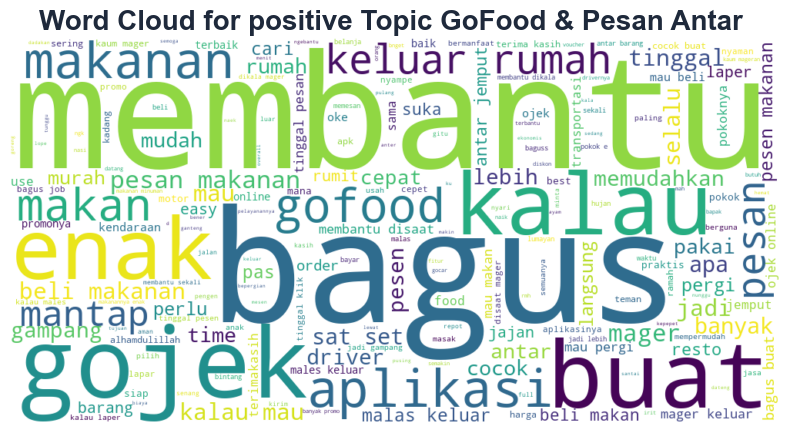

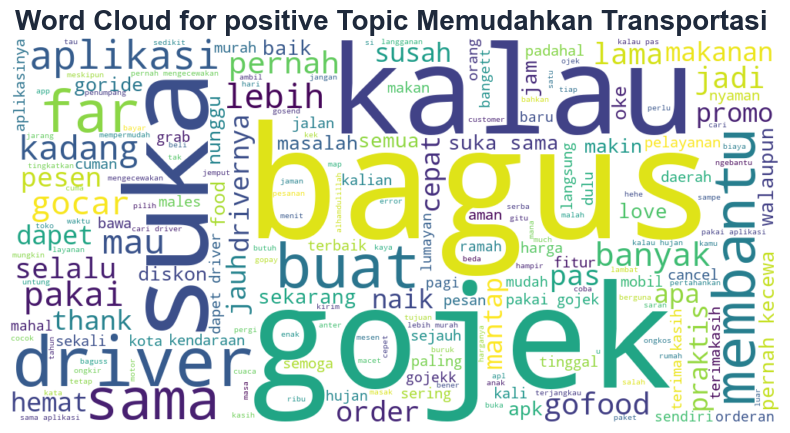

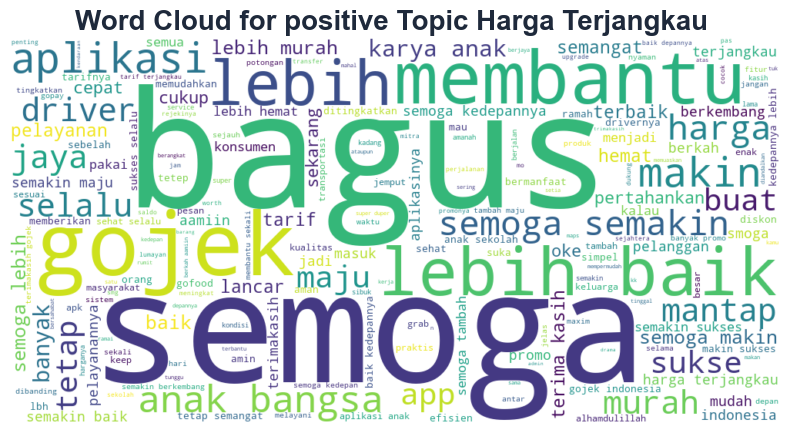

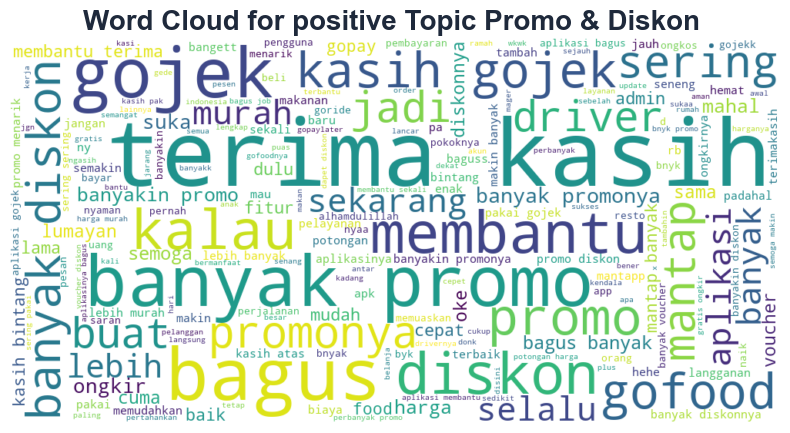

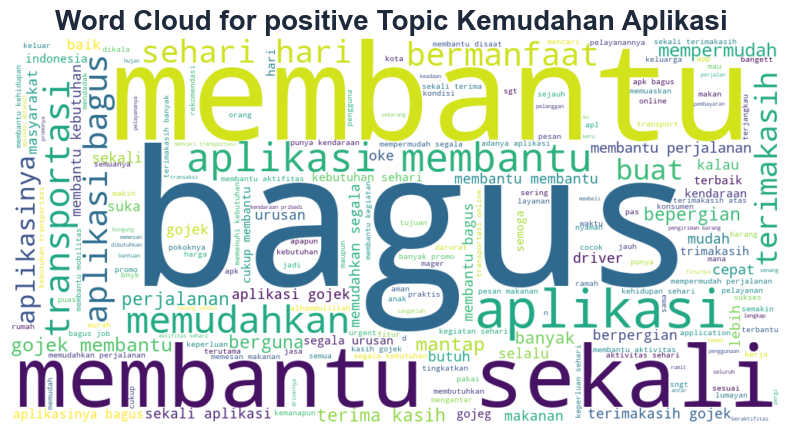

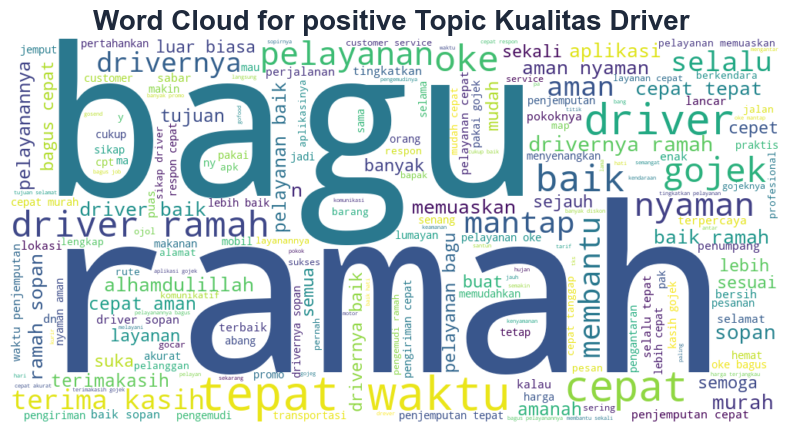

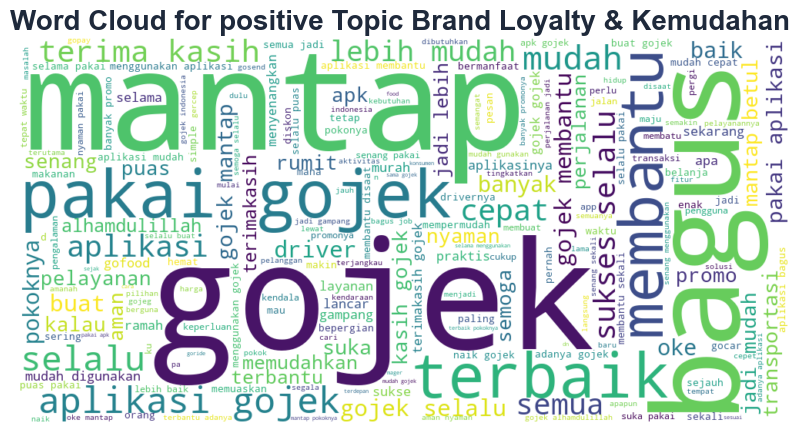

In [320]:
pos_topic_counts = df_pos['topic'].value_counts().sort_values()
neg_topic_counts = df_neg['topic'].value_counts().sort_values()

for label in pos_topic_counts.index:
    text = ' '.join(df_pos[df_pos['topic'] == label]['cleaned_content'])
    generate_wordcloud(text, f'Word Cloud for positive Topic {label} ')

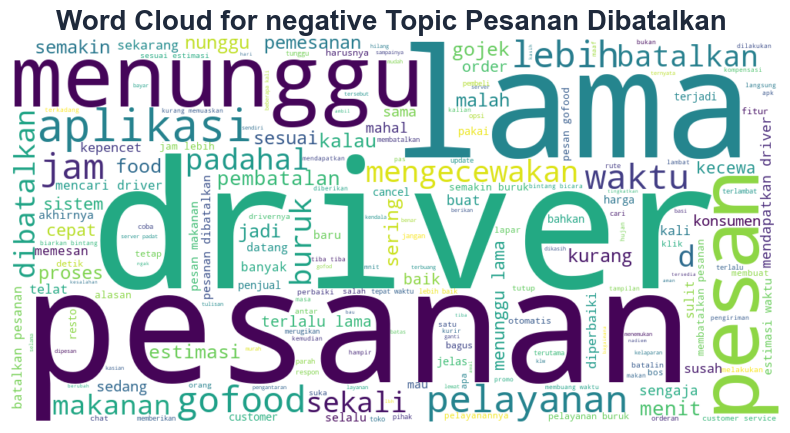

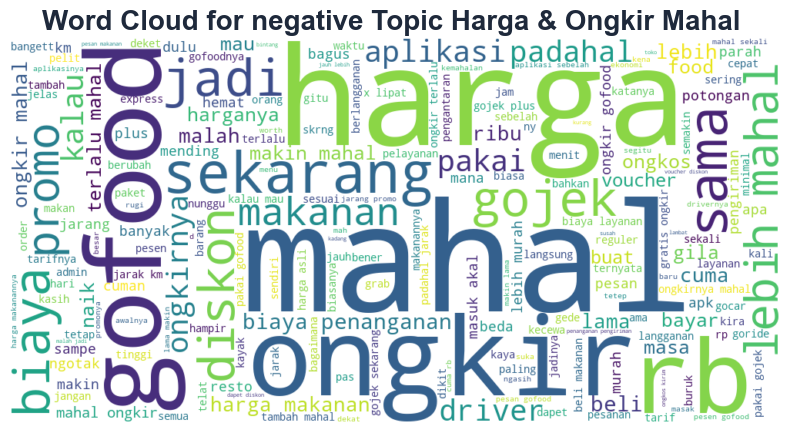

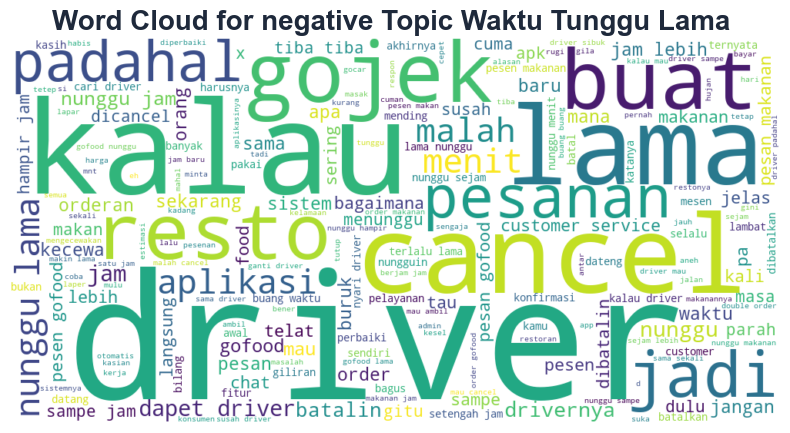

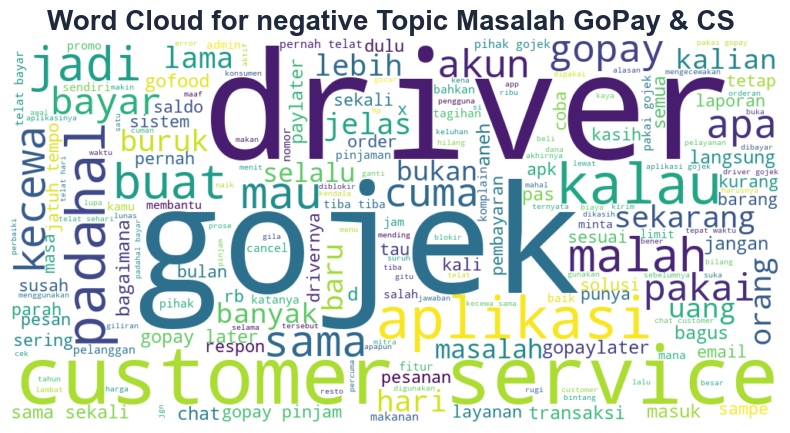

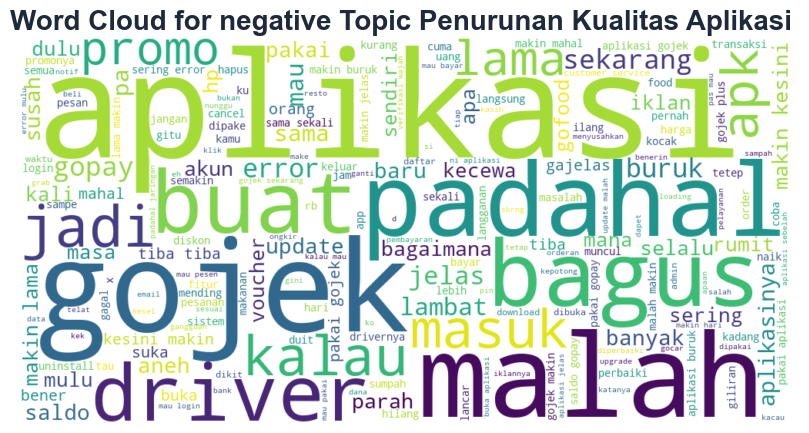

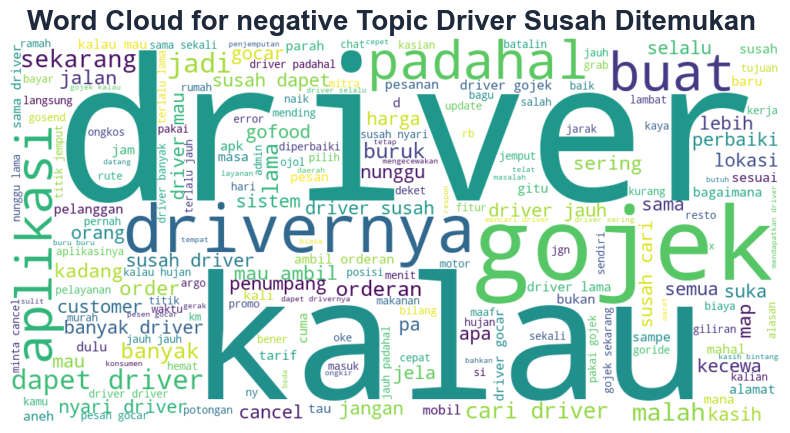

In [321]:
for label in neg_topic_counts.index:
    text = ' '.join(df_neg[df_neg['topic'] == label]['cleaned_content'])
    generate_wordcloud(text, f'Word Cloud for negative Topic {label} ')

### E.2. Top Word Frequency from Topics

In [323]:
def word_frequency_result(df, label):
    subset = df[df['topic'] == label]

    vectorizer = CountVectorizer()
    X = vectorizer.fit_transform(subset['cleaned_content'])

    freq = X.sum(axis=0).A1
    vocab = vectorizer.get_feature_names_out()

    freq_df = pd.DataFrame({'word': vocab, 'frequency': freq})
    freq_df = freq_df.sort_values(by='frequency', ascending=False)

    return freq_df

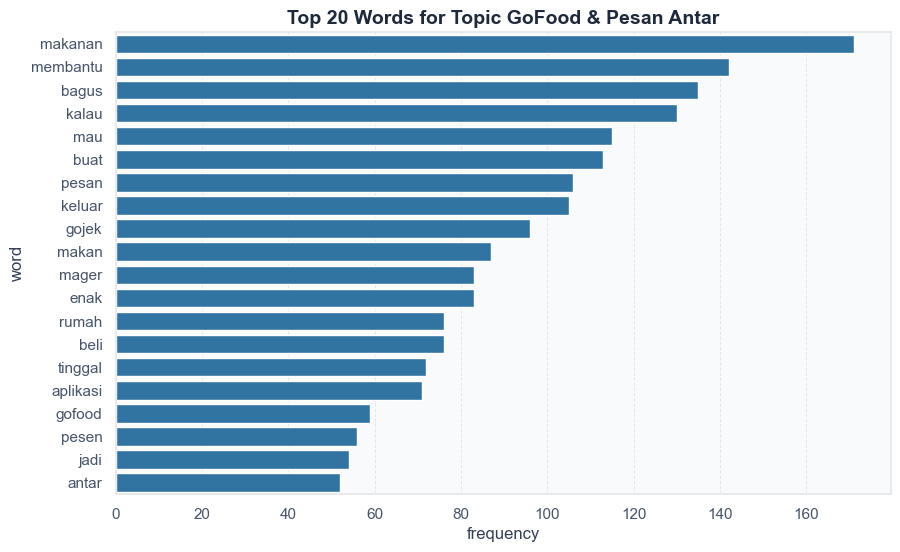

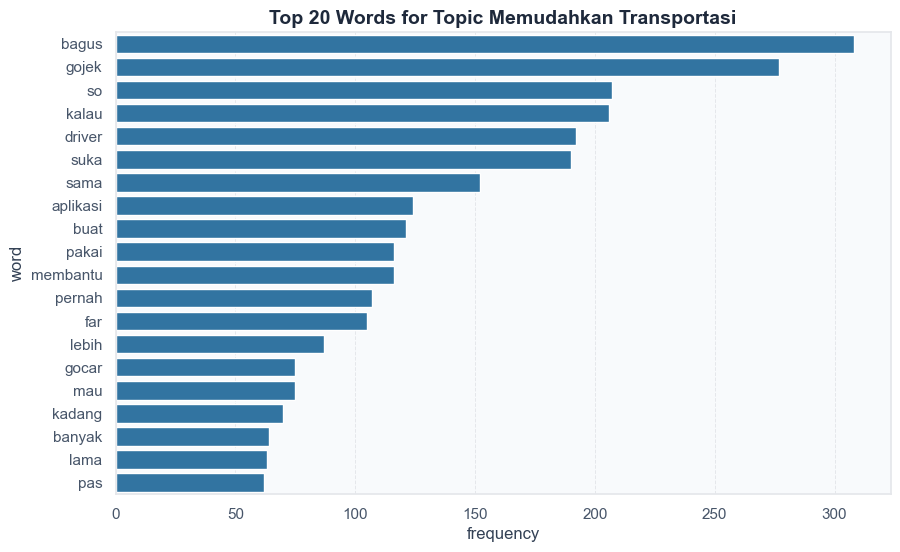

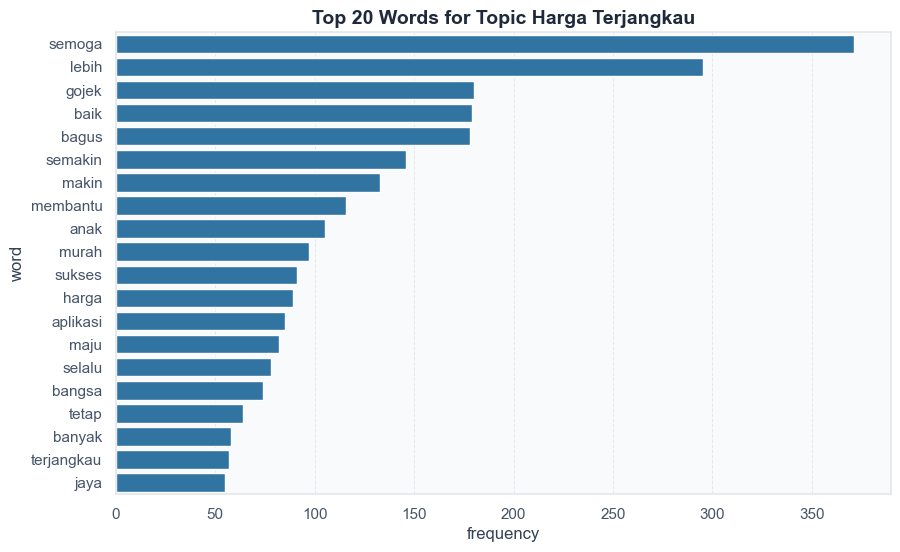

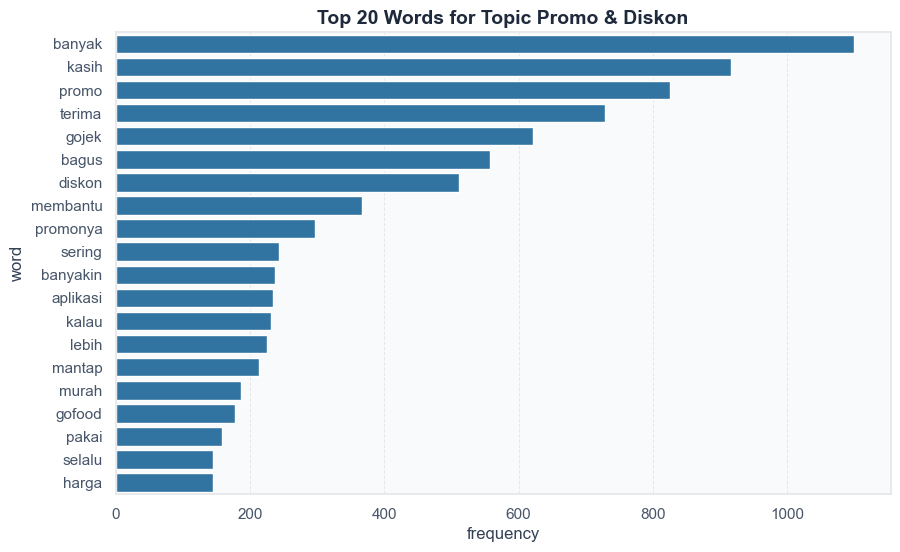

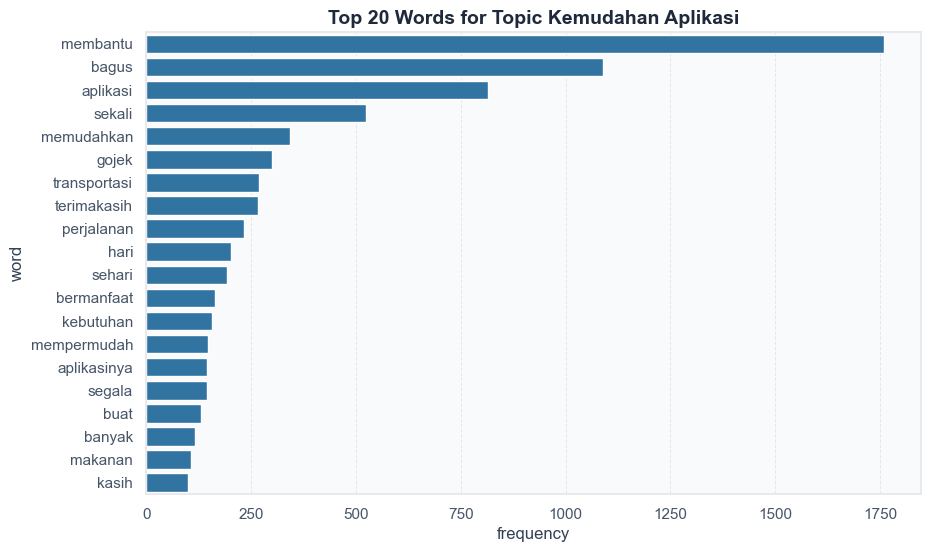

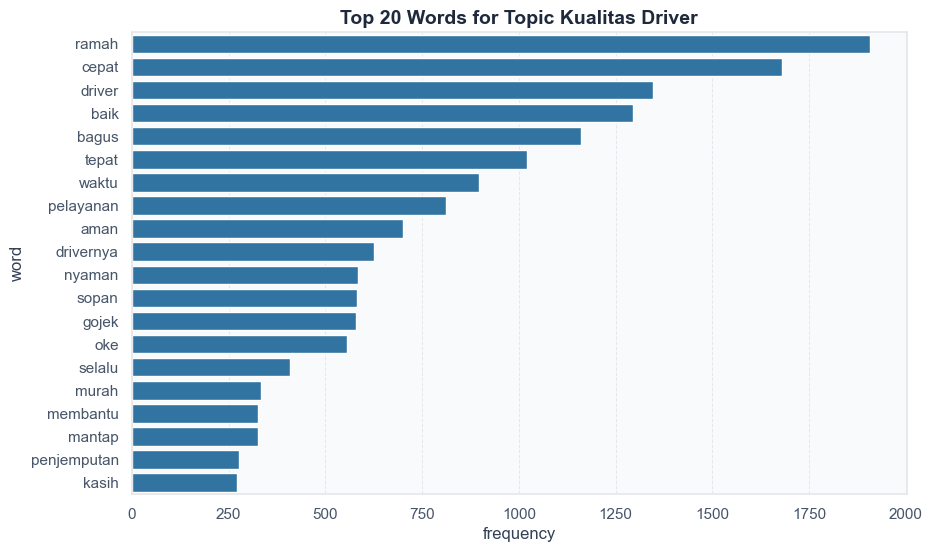

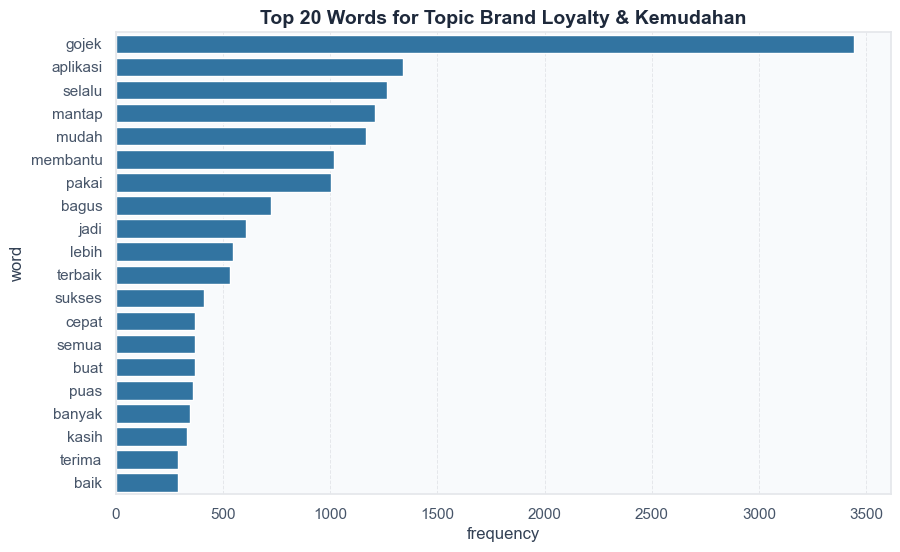

In [324]:
for label in pos_topic_counts.index:
    freq_df = word_frequency_result(df_pos, label)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=freq_df.head(20), x='frequency', y='word')
    plt.title(f'Top 20 Words for Topic {label}')
    plt.show()

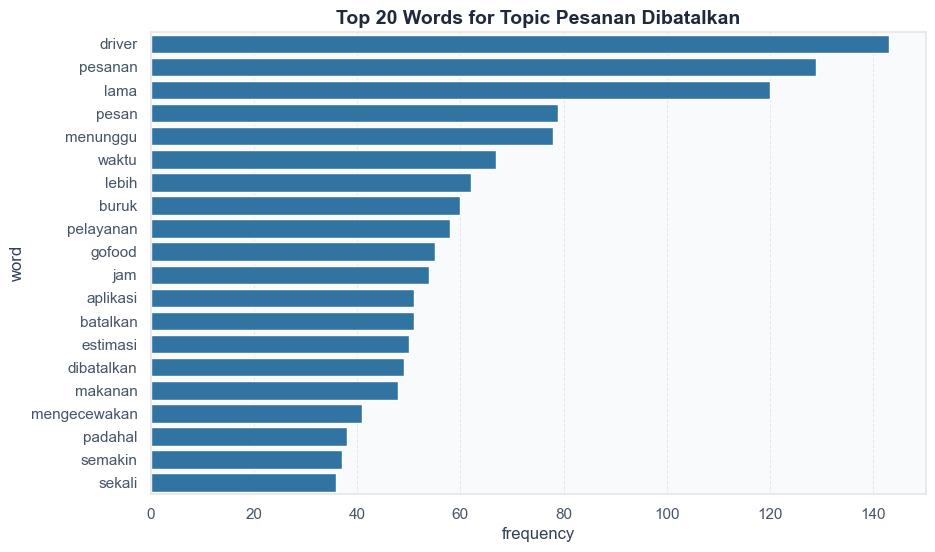

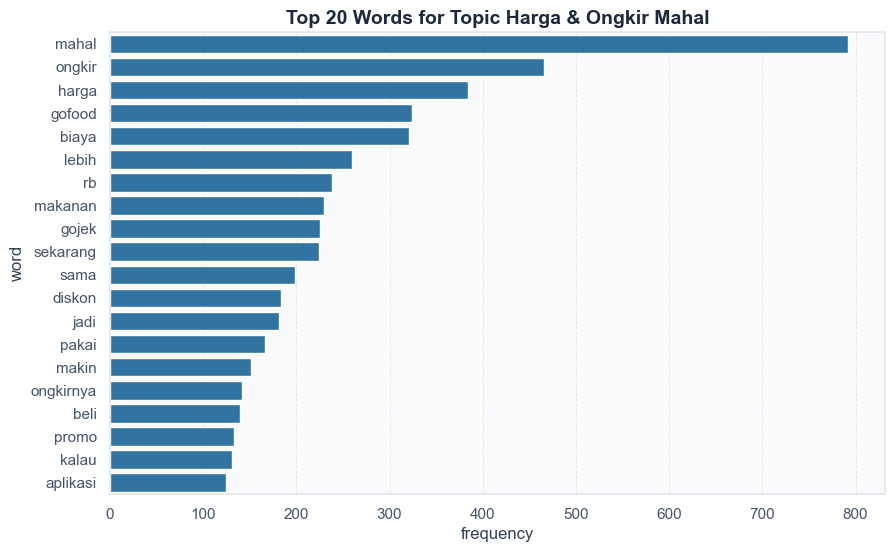

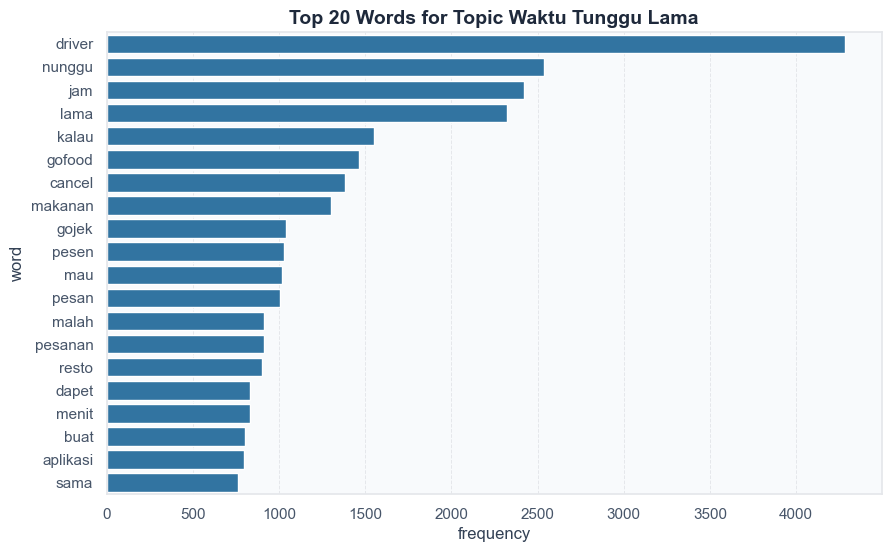

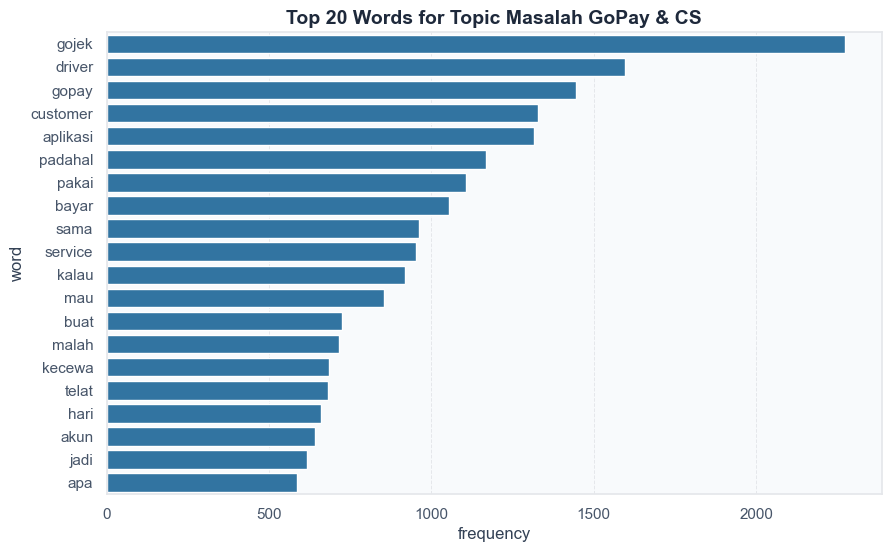

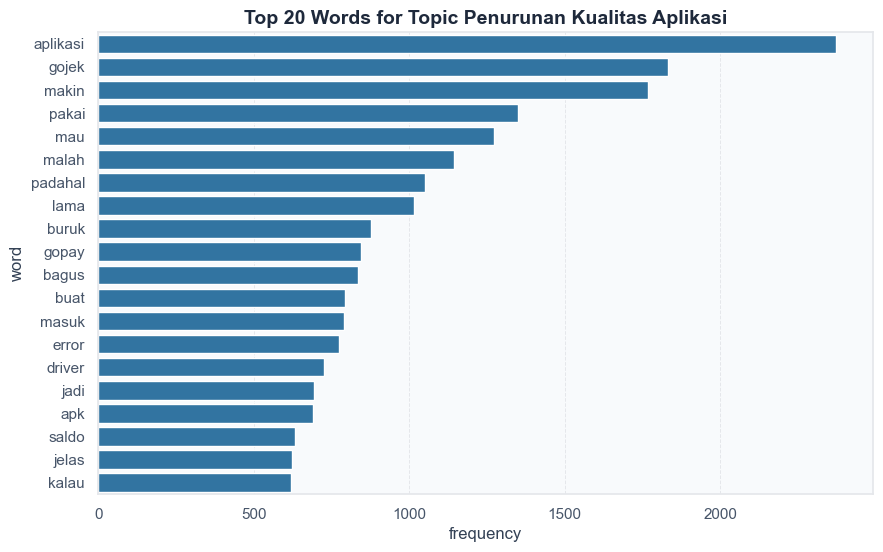

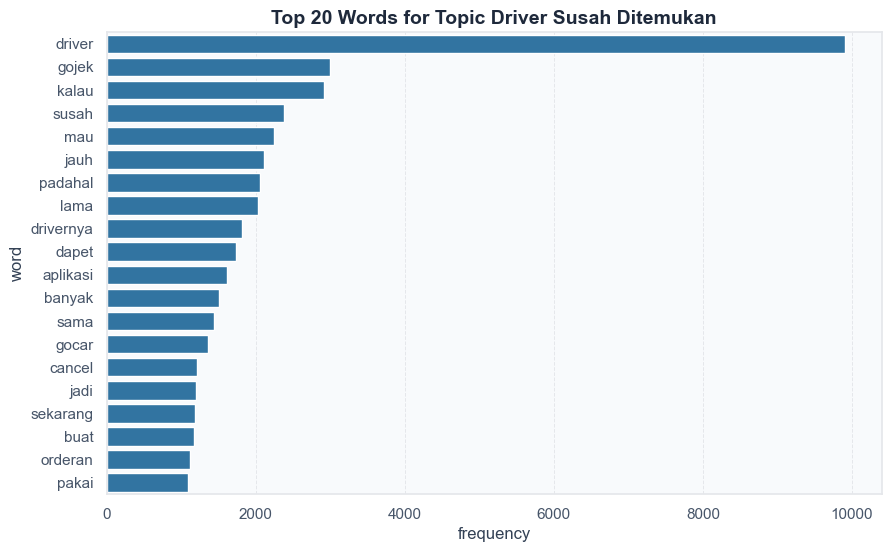

In [325]:
for label in neg_topic_counts.index:
    freq_df = word_frequency_result(df_neg, label)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=freq_df.head(20), x='frequency', y='word')
    plt.title(f'Top 20 Words for Topic {label}')
    plt.show()

### E.3. Analysis per Major Version

Sekarang kita akan masuk lebih dalam pada analisis topic dari setiap Major Versions. Major Version adalah prefix pertama pada kode app version Gojek. Misalkan versi (5.72.1), maka masuk pada major version 5.x.

In [ ]:
df_result['major_version'].value_counts()
# 2.x dan 1.x terlalu dikit banget, susah di analisis

major_version
5.x    29157
4.x    22981
3.x      255
2.x       22
1.x        4
Name: count, dtype: int64

karena jumlah major version yang kurang untuk dilakukan analisis lebih lagi, maka kami memutuskan untuk hanya menganalisis major version 3.x ke atas.

In [295]:
df_pos = df_pos[df_pos['major_version'].isin(['3.x', '4.x', '5.x'])]
df_neg = df_neg[df_neg['major_version'].isin(['3.x', '4.x', '5.x'])]
df_result = pd.concat([df_pos, df_neg], ignore_index=True)

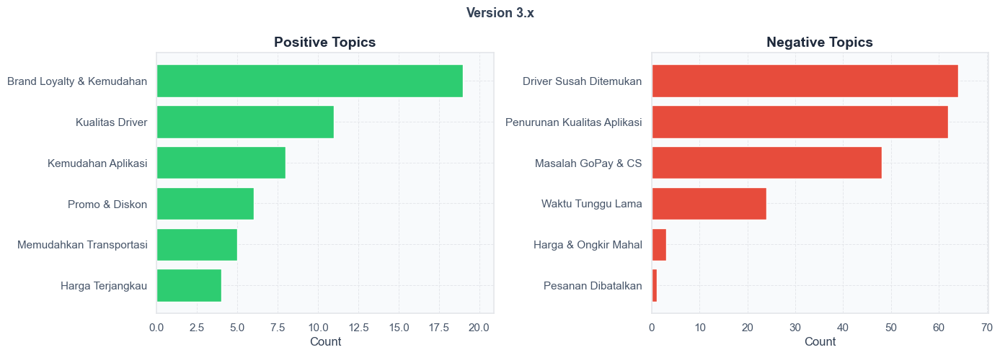

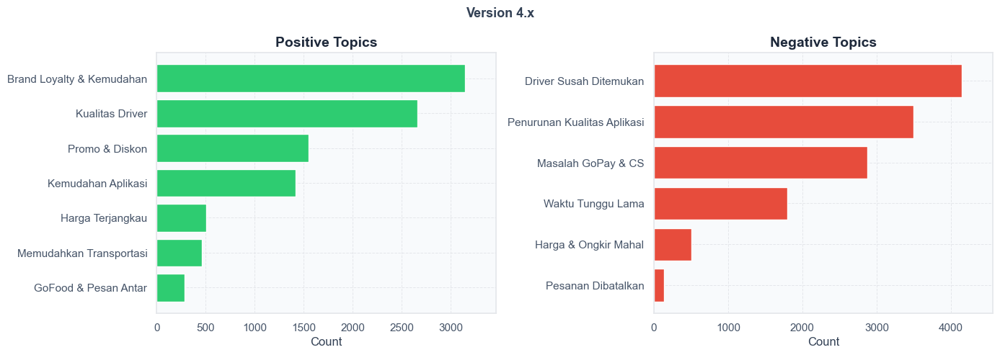

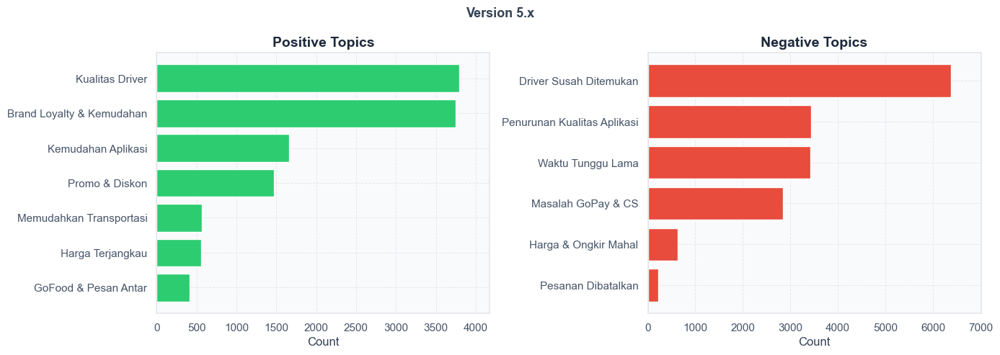

In [296]:
major_versions = ['3.x', '4.x', '5.x']
for version in major_versions:
    df_ver_pos = df_pos[df_pos['major_version'] == version]
    df_ver_neg = df_neg[df_neg['major_version'] == version]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f'Version {version}', fontsize=13, fontweight='bold')

    # Positive
    if df_ver_pos.empty:
        axes[0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12, color='gray')
        axes[0].set_xlim(0, 1)
    else:
        pos_counts = df_ver_pos['topic'].value_counts().sort_values()
        axes[0].barh(pos_counts.index, pos_counts.values, color='#2ECC71')
        axes[0].set_xlim(0, pos_counts.values.max() * 1.1)
    axes[0].set_title('Positive Topics')
    axes[0].set_xlabel('Count')

    # Negative
    if df_ver_neg.empty:
        axes[1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12, color='gray')
        axes[1].set_xlim(0, 1)
    else:
        neg_counts = df_ver_neg['topic'].value_counts().sort_values()
        axes[1].barh(neg_counts.index, neg_counts.values, color='#E74C3C')
        axes[1].set_xlim(0, neg_counts.values.max() * 1.1)
    axes[1].set_title('Negative Topics')
    axes[1].set_xlabel('Count')

    plt.tight_layout()
    plt.show()

Pada visualisasi di atas, kita dapat melihat jumlah review pada setiap topik yang dipisahkan berdasarkan major version dan sentimen (positive dan negatif). Berikut adalah insight yang terlihat dari hasil plot di atas:
- Pada positive topics, brand loyalty dan kemudahan menjadi topic terbanyak pada versi 3.x dan 4.x. Kemudian Kualitas driver muncul sebagai topik terbanyak pada versi 5.x. Hal ini menandakan peningkatan kualitas driver secara individual yang meningkat sehingga menjadi kepuasan pelanggan Gojek.
- Pada negative topics, driver sulit ditemukan menjadi topik terbanyak yang konsisten ada pada setiap major version. Penurunan kualitas aplikasi dan masalah pada Gopay dan CS juga termasuk dalam keluhan pelanggan Gojek. Pada versi 5.x, mulai banyak reviews mengenai waktu tunggu yang lama, ini termasuk dalam order Gojek dan order Gofood.

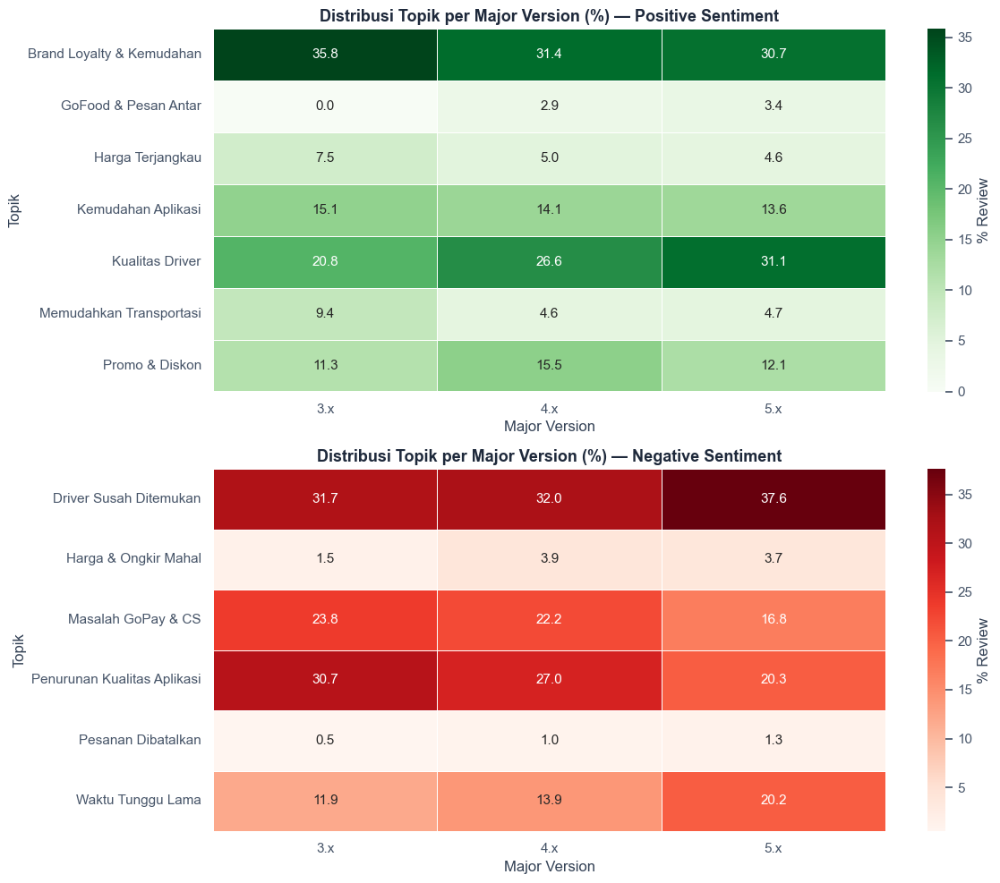

In [297]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

for ax, (df_sent, label, cmap) in zip(axes, [
    (df_pos, 'Positive', 'Greens'),
    (df_neg, 'Negative', 'Reds')
]):
    pivot = df_sent.groupby(['major_version', 'topic']).size().unstack(fill_value=0)
    pivot_pct = pivot.div(pivot.sum(axis=1), axis=0) * 100

    pivot_pct = pivot_pct.loc[sorted(pivot_pct.index, key=lambda x: int(x.replace('.x', '')))]

    sns.heatmap(
        pivot_pct.T,
        annot=True, fmt='.1f',
        cmap=cmap,
        linewidths=0.5, linecolor='white',
        ax=ax,
        cbar_kws={'label': '% Review'}
    )
    ax.set_title(f'Distribusi Topik per Major Version (%) — {label} Sentiment',
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Major Version')
    ax.set_ylabel('Topik')

plt.tight_layout()
plt.show()

Plot atau Heatmap di atas menunjukkan proporsi tiap topik, sehingga tren perubahan kepentingan topik antar versi dapat dibandingkan dengan lebih adil. Berikut adalah insight yang didapat dari plot di atas:
- Kita dapat melihat beberapa perbaikan pada aplikasi dan sistem Gojek yang terlihat dari topics penurunan kualitas aplikasi yang turun dari 30.7% menjadi 20.3%, menunjukkan Gojek terus memperbarui UI dan performa aplikasi mereka. Kemudian masalah Gopay dan CS juga turun dari 23.8% ke 16.8%. Kemudian seiring waktu, kepuasan pelanggan berpusat pada kualitas driver yang semakin meningkat dan mendominasi reviews pada versi 5.x.
- Namun ada beberapa hal yang perlu diperhatikan dan diwaspadai, driver susah ditemukan terus meningkat dan menjadi keluhan terbesar sepanjang versi, hal ini menandakan Gojek masih belum dapat mengatasi masalah ketersediaan driver dengan baik dan strategis. Waktu tunggu lama juga perlu diwaspadai dan berpotensi untuk terus meningkat pada versi-versi selanjutanya, dikarenakan driver susah ditemukan dan waktu tunggu lama memiliki relasi yang cukup kuat. Dua hal ini berpotensi untuk menganggu kepuasan pengguna Gojek di kemudian hari.

### E.4. Analysis per Minor Version

Untuk melihat dan membandingkan versi dengan lebih jelas, mari kita lihat analysis topic di level minor versions. Analisis minor version difokuskan pada top 5 minor version terbanyak pada major version 4.x dan 5.x.

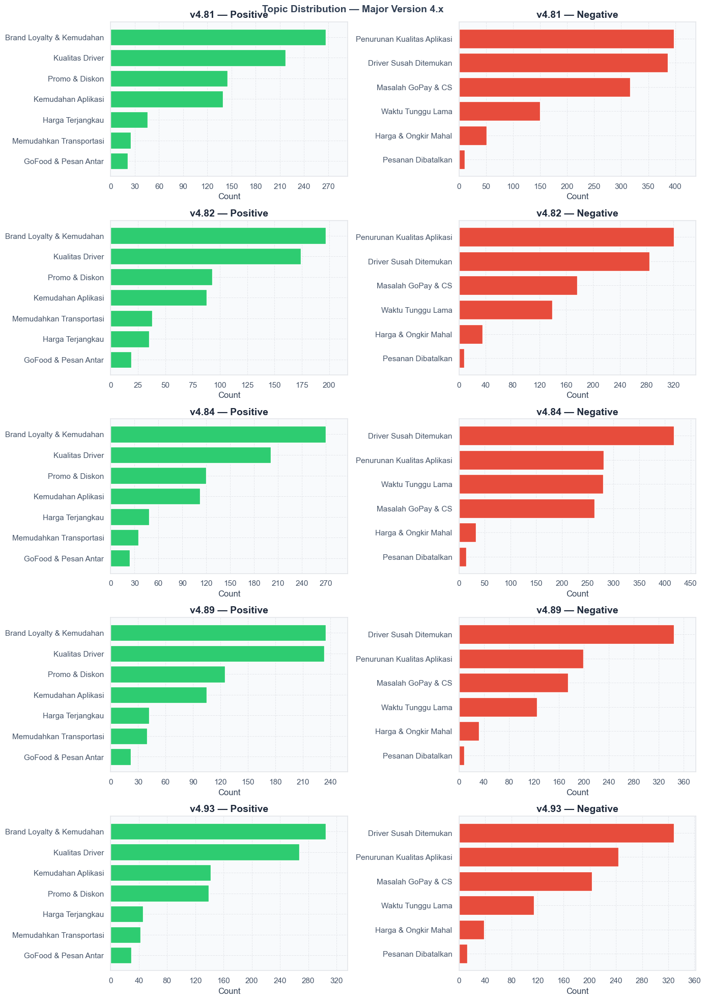

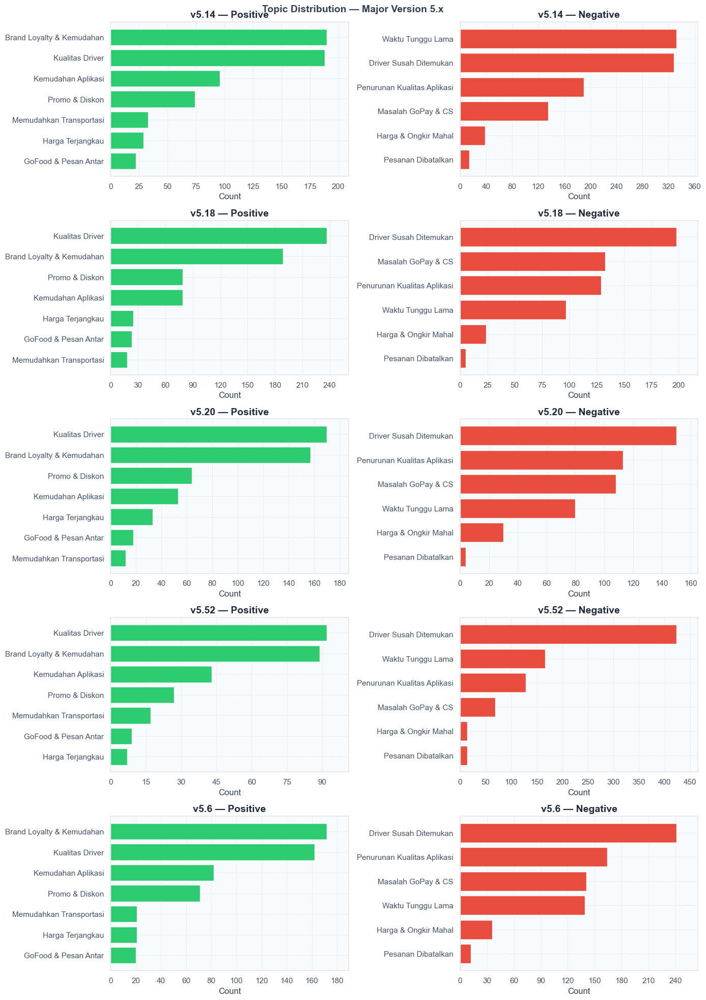

In [303]:
from matplotlib.ticker import MaxNLocator

for major in ['4.x', '5.x']:
    df_major_pos = df_pos[df_pos['major_version'] == major]
    df_major_neg = df_neg[df_neg['major_version'] == major]

    top5_versions = (
        pd.concat([df_major_pos, df_major_neg])['minor_version']
        .value_counts()
        .head(5)
        .index
        .tolist()
    )
    top5_versions = sorted(top5_versions) 

    fig, axes = plt.subplots(len(top5_versions), 2, figsize=(14, len(top5_versions) * 4))
    fig.suptitle(f'Topic Distribution — Major Version {major}', fontsize=14, fontweight='bold')

    for i, version in enumerate(top5_versions):
        df_ver_pos = df_major_pos[df_major_pos['minor_version'] == version]
        df_ver_neg = df_major_neg[df_major_neg['minor_version'] == version]

        ax_pos = axes[i][0]
        ax_neg = axes[i][1]


        pos_counts = df_ver_pos['topic'].value_counts().sort_values()
        ax_pos.barh(pos_counts.index, pos_counts.values, color='#2ECC71')
        ax_pos.set_xlim(0, pos_counts.values.max() * 1.1)
        ax_pos.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax_pos.set_title(f'v{version} — Positive', fontweight='bold')
        ax_pos.set_xlabel('Count')


        neg_counts = df_ver_neg['topic'].value_counts().sort_values()
        ax_neg.barh(neg_counts.index, neg_counts.values, color='#E74C3C')
        ax_neg.set_xlim(0, neg_counts.values.max() * 1.1)
        ax_neg.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax_neg.set_title(f'v{version} — Negative', fontweight='bold')
        ax_neg.set_xlabel('Count')

    plt.tight_layout()
    plt.show()

Dari plot di atas, kita dapat melihat distribusi topik pada 5 minor versions berurutan dengan data yang cukup untuk dianalisis. Berikut adalah insights yang kami dapatkan dari plot di atas:
- Untuk major version 4.x, topik positif tergolong stabil. Topik seperti brand loyalty dan kemudahan konsisten menempati posisi pertama dan diikuti dengan kualitas driver di posisi kedua. Ini menunjukkan Gojek mampu mempertahankan kepuasan pelanggan dari versi 4.81 hingga 4.93. Untuk topik negatif, penurunan kualitas aplikasi menjadi keluhan nomor satu pelanggan, dengan driver susah ditemukan sebagai topik kedua. Mulai dari versi 4.84 driver susah ditemukan menjadi top keluhan pelanggan dan bertahan hingga versi 4.93. Hal ini menunjukkan bahwa pada versi 4.x, Gojek belum menemukan strategi yang tepat untuk mengatasi keluhan pengguna terutama di sulitnya menemukan driver. Gojek juga masih bertahap dalam mengevaluasi kinerja aplikasi agar dapat digunakan dan diakses dengan baik oleh pelanggan.
- Untuk major version 5.x, Kualitas driver berhasil berada di puncak topik positif. Ini menunjukkan bahwa kualitas driver individual terus meningkat dan semakin kuatnya pengakuan pengguna terhadap kinerja driver. Pada negative topics, terdapat beberapa anomali utama, yaitu Waktu tunggu lama dan driver susah ditemukan melonjak dengan sangat jauh melampaui topik lainnya. Hal ini dapat dianalisis lebih lanjut dan menjadi kunci strategi Gojek dalam menghadapi problem serupa.

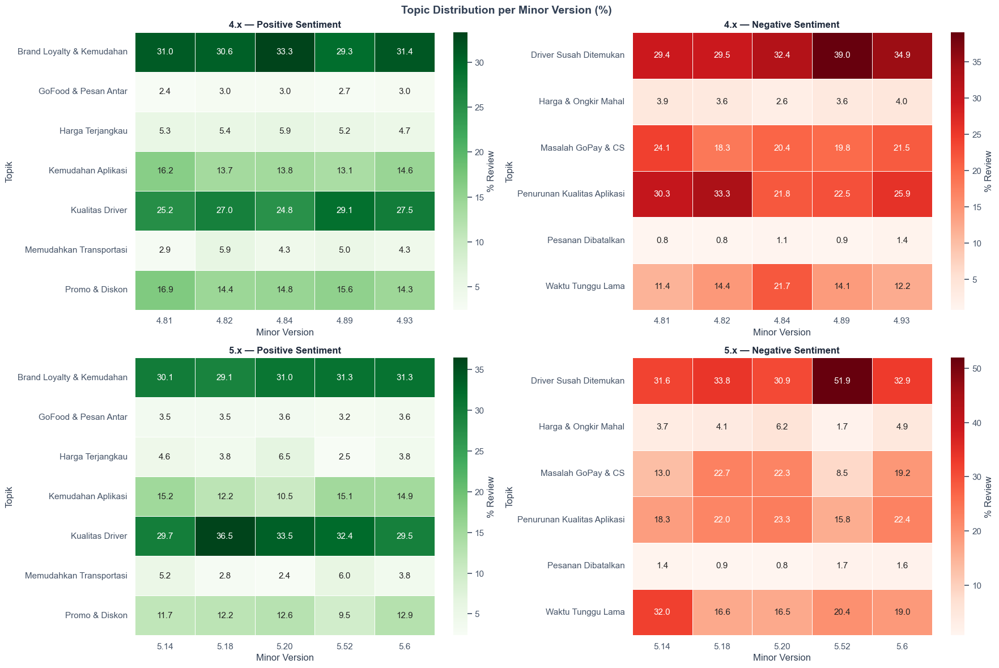

In [305]:
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle('Topic Distribution per Minor Version (%)', fontsize=14, fontweight='bold')

for row, major in enumerate(['4.x', '5.x']):
    df_major_pos = df_pos[df_pos['major_version'] == major]
    df_major_neg = df_neg[df_neg['major_version'] == major]

    # Ambil top 5 versi terbanyak
    top5_versions = sorted(
        pd.concat([df_major_pos, df_major_neg])['minor_version']
        .value_counts().head(5).index.tolist()
    )

    df_top_pos = df_major_pos[df_major_pos['minor_version'].isin(top5_versions)]
    df_top_neg = df_major_neg[df_major_neg['minor_version'].isin(top5_versions)]

    for col, (df_sent, label, cmap) in enumerate([
        (df_top_pos, 'Positive', 'Greens'),
        (df_top_neg, 'Negative', 'Reds')
    ]):
        pivot = df_sent.groupby(['minor_version', 'topic']).size().unstack(fill_value=0)
        pivot = pivot.loc[top5_versions]  # pastikan urutan versi
        pivot_pct = pivot.div(pivot.sum(axis=1), axis=0) * 100

        ax = axes[row][col]
        sns.heatmap(
            pivot_pct.T,
            annot=True, fmt='.1f',
            cmap=cmap,
            linewidths=0.5, linecolor='white',
            ax=ax,
            cbar_kws={'label': '% Review'}
        )
        ax.set_title(f'{major} — {label} Sentiment', fontsize=12, fontweight='bold')
        ax.set_xlabel('Minor Version')
        ax.set_ylabel('Topik')

plt.tight_layout()
plt.show()

Selanjutnya kita akan melihat Heatmap minor versions di atas untuk melihat proporsi topik dengan lebih jelas dan adil. Berikut adalah insight yang kami dapatkan:
- Pada Heatmap versi 4.x, penurunan kualitas aplikasi membaik namun driver susah ditemukan mulai meningkat. Ini menandakan Gojek mampu mengatasi masalah teknis pada aplikasi namun belum menemukan strategi optimal untuk mengatasi driver sulit ditemukan. Pada versi 4.89, proporsi driver susah ditemukan mencapai titik tertinggi yaitu 39%.
- Pada heatmap versi 5.x, waktu tunggu lama mencapai 32% namun konsisten menurun sampai 19% di versi terbaru yaitu 5.6. Terjadi anomali terbesar yaitu pada versi 5.52 di mana topik driver susah ditemukan mencapai 51.9% lebih dari separuh reviews di versi tersebut. Berdasarkan informasi yang kami temukan, versi ini dirilis pada 1 April 2026 dan hal ini berkaitan dengan krisis ojol pada Ramadan 2026. Fenomena ini terjadi pada bulan Ramadan 2026 ketika banyak driver Gojek yang melakukan mudik dan banyak menghabiskan waktu bersama keluarga selama/setelah lebaran. Hal ini juga dapat disebabkan oleh cuaca ekstrem yang melanda Indonesia belakangan ini dan beberapa berita juga menyebutkan bahwa terdapat penurunan tarif melalui sistem layanan hemat yang mempengaruhi pendapatan driver. Hal-hal ini menyebabkan lonjakan cukup tinggi pada versi 5.52.

### E.4. Conclusion from Each Versions

In [ ]:
records = []

all_minor = sorted(df_result['minor_version'].unique())

for version in all_minor:
    df_v_pos = df_pos[df_pos['minor_version'] == version]
    df_v_neg = df_neg[df_neg['minor_version'] == version]

    top3_pos = df_v_pos['topic'].value_counts().head(3).index.tolist()
    top3_neg = df_v_neg['topic'].value_counts().head(3).index.tolist()

    records.append({
        'Minor Version': version,
        'Kelebihan (Top 3)': ' | '.join(top3_pos) if top3_pos else '-',
        'Kekurangan (Top 3)': ' | '.join(top3_neg) if top3_neg else '-',
    })

df_summary = pd.DataFrame(records)
df_summary

,Minor Version,Kelebihan (Top 3),Kekurangan (Top 3)
0,3.0,-,Waktu Tunggu Lama
1,3.10,Brand Loyalty & Kemudahan,Penurunan Kualitas Aplikasi | Waktu Tunggu Lama
2,3.11,Memudahkan Transportasi | Kualitas Driver,Driver Susah Ditemukan | Penurunan Kualitas Ap...
3,3.12,-,Penurunan Kualitas Aplikasi | Waktu Tunggu Lama
4,3.14,Kemudahan Aplikasi,Driver Susah Ditemukan
...,...,...,...
205,5.60,Kualitas Driver | Brand Loyalty & Kemudahan | ...,Driver Susah Ditemukan | Penurunan Kualitas Ap...
206,5.61,Brand Loyalty & Kemudahan | Kualitas Driver | ...,Driver Susah Ditemukan | Penurunan Kualitas Ap...
207,5.7,Brand Loyalty & Kemudahan | Kualitas Driver | ...,Driver Susah Ditemukan | Penurunan Kualitas Ap...
208,5.8,Brand Loyalty & Kemudahan | Kualitas Driver | ...,Driver Susah Ditemukan | Waktu Tunggu Lama | M...


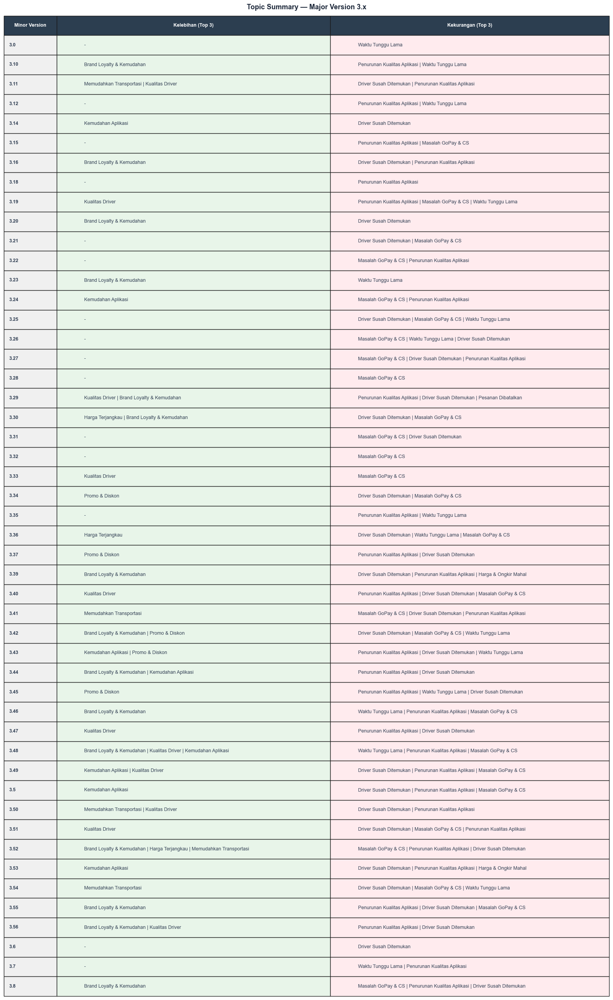

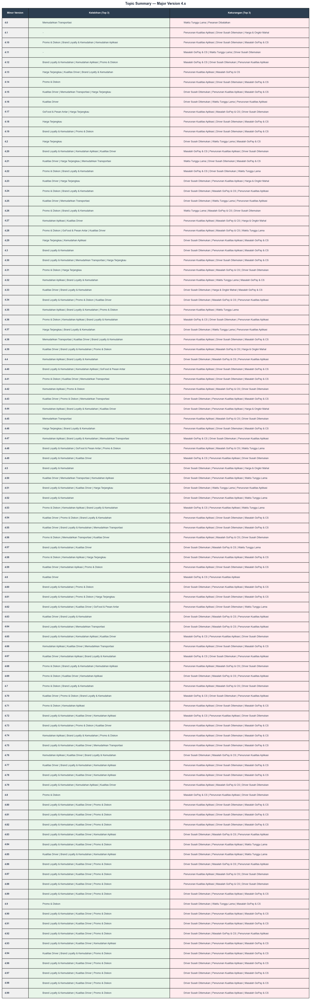

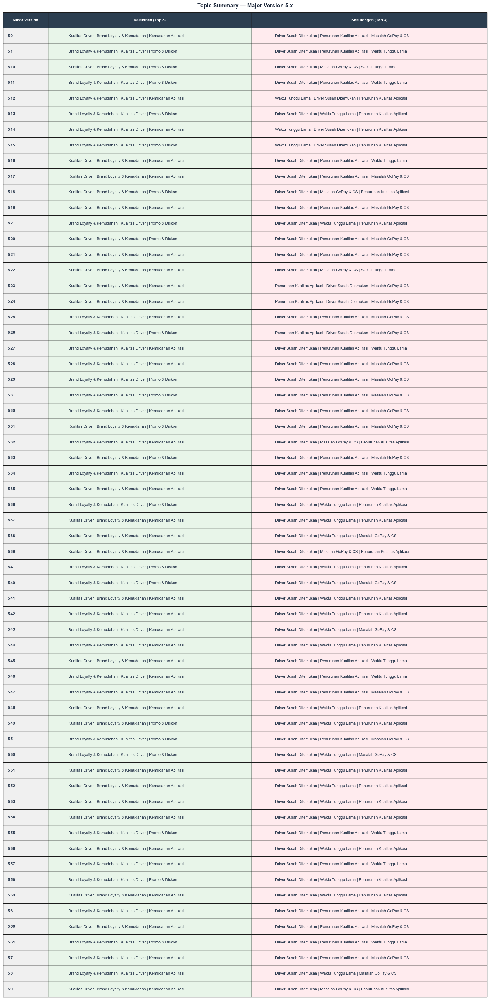

In [ ]:
for major in ['3.x', '4.x', '5.x']:
    df_major = df_summary[df_summary['Minor Version'].str.startswith(major.replace('.x', '.'))]
    
    if df_major.empty:
        continue

    n_rows = len(df_major)
    fig, ax = plt.subplots(figsize=(16, n_rows * 0.5 + 1.5))
    ax.axis('off')
    
    table_data = df_major[['Minor Version', 'Kelebihan (Top 3)', 'Kekurangan (Top 3)']].values.tolist()
    col_labels = ['Minor Version', 'Kelebihan (Top 3)', 'Kekurangan (Top 3)']
    
    table = ax.table(
        cellText=table_data,
        colLabels=col_labels,
        loc='center',
        cellLoc='left',
        bbox=[0, 0, 1, 1]  
    )
    
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.auto_set_column_width([0, 1, 2])
    
    for col in range(3):
        table[0, col].set_facecolor('#2C3E50')
        table[0, col].set_text_props(color='white', fontweight='bold')
    
    for row in range(1, n_rows + 1):
        table[row, 0].set_facecolor('#F0F0F0')
        table[row, 0].set_text_props(fontweight='bold')
        table[row, 1].set_facecolor('#E8F5E9')
        table[row, 2].set_facecolor('#FFEBEE')
    
    ax.set_title(f'Topic Summary — Major Version {major}', 
                 fontsize=13, fontweight='bold', pad=12)
    
    plt.tight_layout()
    plt.show()

=================================================================================================================================================================================================================================================

## F. Insights and Findings

Setelah mengerjakan project kami di atas, berikut ini adalah beberapa insights dan findings yang telah kami analisis:
1. Model LDA untuk topic modeling menunjukkan performa dan hasil yang cukup memuaskan. Berdasarkan hasil topic modeling, didapatkan 7 topic untuk positive sentiment dan 6 topic untuk negative sentiment. Important words atau hasil topic menunjukkan hasil yang baik dan dapat dibedakan satu topic dengan topic lainnya. 

    Berikut ini adalah topic utama dari positive sentiment:
    - Harga Hemat dan Terjangkau
    - Aplikasi Mudah dan Kepuasan Pelanggan (Brand Loyalty)
    - Banyak Promo dan Diskon
    - Kemudahan Aplikasi
    - Memudahkan Transportasi dan Praktis
    - Layanan Gofood dan Pesan Antar
    - Kualitas Driver yang baik, ramah, tepat waktu

    Berikut ini adalah topic utama dari negative sentiment:
    - Masalah pada Gopay, Gopaylater dan Customer Service
    - Harga dan Ongkir Mahal
    - Penurunan Kualitas Aplikasi
    - Driver Susah Ditemukan
    - Waktu Tunggu Lama
    - Pesanan Sering Dibatalkan

2. Setelah model melakukan topic modeling, kami melakukan human judgement kembali untuk menguji presisi dari model. Kami mengambil 100 data random dan melakukan anotasi secara manual. Hasil yang kami dapat adalah model LDA memperoleh 0.86 precision, dan hasil ini merupakan hasil yang bagus bagi model LDA dengan kondisi data scraping yang noisy dan terbatas.

3. Driver menjadi faktor utama dan paling dominan di kedua sisi sentimen. Di sisi positive sentiment, Kualitas driver meningkat seiring berjalannya major versions, mulai dari 3.x hingga 5.x driver menjadi salah satu faktor utama kepuasan pelanggan gojek. Begitu juga pada negative sentiment, pada 3 major versions berturut-turut, driver menjadi faktor utama ketidakpuasan pelanggan dikarenakan driver yang sulit ditemukan. Implikasinya pada industri adalah, ketersediaan driver menjadi bottleneck utama yang belum terselesaikan sampai saat ini. Walaupun peningkatan kualitas driver individual terus meningkat, hal ini tidak cukup apabila ketersediaan driver tidak terjaga dan tidak available pada jam-jam sibuk.

4. Topic penurunan kualitas aplikasi pada sentiment negatif menunjukkan perbaikan yang konsisten dari versi 3.x sampai ke 5.x. Hal ini menunjukkan pengembangan aplikasi termasuk UI/UX dan performa aplikasi terus ditingkatkan oleh developer Gojek untuk menjaga kepuasan pelanggan. Hal ini juga terjadi pada masalah Gopay, Gopaylater, dan CS, yang reviewsnya semakin menurun mengenai topic tersebut, hal ini menunjukkan peningkatan kualitas pada layanan Gopay dan CS Gojek. 

5. Ditengah-tengah masalah-masalah yang berhasil diatasi oleh Gojek, terjadi penurunan pada kualitas pick up, yaitu peningkatan reviews pada waktu tunggu lama, yang terus meningkat secara konsisten dari versi 3.x ke 5.x. Berdasarkan sumber berita seperti Kompas dan Readers, waktu tunggu lama dan kesulitan driver ditemukan dapat disebabkan oleh beberapa faktor, seperti:
    - Cuaca ekstrim seperti panas dan hujan yang menyebabkan driver susah ditemukan dan waktu tunggu driver yang lama
    - Kemacetan lalu lintas yang menyebabkan driver banyak menolak order dikarenakan macet menyebabkan penggunaan bahan bakar dan tenaga yang lebih
    - Pendapatan bersih Gojek yang menurun akibat tarif rendah dan potongan dari biaya aplikasi yang besar. Akibatnya banyak driver yang tidak aktif di jam tertentu akibat tarif rendah

6. Topik promo dan diskon secara konsisten masuk menjadi top 3 topic paling positive di setiap version, namun di sisi lain pelanggan juga mengeluhkan harga dan ongkir yang mahal. Pada minor version analysis, Promo & Diskon sedikit turun di 5.x (rata-rata ~12%) dibanding 4.x (~15%), yang berkorelasi dengan meningkatnya keluhan harga mahal di periode yang sama. Implikasi industrinya adalah, perusahaan harus melakukan pengurangan promo atau subsidi yang dilakukan secara bertahap dengan tujuan menjaga stabilitas keuangan perusahaan. 

7. Pada minor version 5.52, terdapat lonjakan Driver Susah Ditemukan yang meningkat hingga 51,9% berada jauh di atas rata-rata. Hal ini kemungkinan berkaitan dengan faktor-faktor eksternal lain yang telah dibahas sebelumnya seperti libur nasional, cuaca, atau perubahan kebijakan intensif driver. Monitoring real time pada distribusi topik per versi dapat berfungsi sebagai early warning system perusahaan dalam mengambil langkah dan strategi untuk mengatasi problem di kemudian hari.

## G. Conclusion

Secara keseluruhan, project ini berhasil menjalankan topic modelign dan analisis bisnis untuk menemukan kelebihan dan kekurangan Gojek dari berbagai versi. Kami berhasil menemukan topik keluhan dan kepuasan pengguna, seperti perbaikan kualitas aplikasi dan Gopay, hingga tantangan ketersediaan driver dan waktu tunggu yang lama. Temuan ini menegaskan bahwa kepuasan pengguna tidak hanya ditentukan oleh kualitas teknis aplikasi, namun juga sangat bergantung pada ekosistem driver yang sehat dan profesional. Ke depannya, pendekatan ini dapat dikembangkan lebih jauh sebagai sistem monitoring real time perusahaan berbasis ulasan pengguna. Tujuannya agar perusahaan dapat mendeteksi masalah lebih awal, merespons perubahan pengguna secara proaktif, dan mengambil keputusan strategis berdasarkan data.